# A common mistake when configuring a neural network is to first normalize the data before splitting the data.

In [1]:
# Tensorflow / Keras
from tensorflow import keras # for building Neural Networks
print('Tensorflow/Keras: %s' % keras.__version__) # print version
from keras.models import Sequential # for creating a linear stack of layers for our Neural Network
from keras import Input # for instantiating a keras tensor
from keras.layers import Dense # for creating regular densely-connected NN layers.

# Data manipulation
import pandas as pd # for data manipulation
print('pandas: %s' % pd.__version__) # print version
import numpy as np # for data manipulation
print('numpy: %s' % np.__version__) # print version

# Sklearn
import sklearn # for model evaluation
print('sklearn: %s' % sklearn.__version__) # print version
from sklearn.model_selection import train_test_split # for splitting data into train and test samples
from sklearn.metrics import classification_report # for model evaluation metrics

# Visualization
import plotly 
import plotly.express as px
import plotly.graph_objects as go
print('plotly: %s' % plotly.__version__) # print version

Tensorflow/Keras: 2.7.0
pandas: 1.3.4
numpy: 1.22.4
sklearn: 1.2.2
plotly: 4.14.3


In [2]:
# Set Pandas options to display more columns
pd.options.display.max_columns=50

# Read in the weather data csv
df=pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/weatherAUS.csv', encoding='utf-8')

# Drop records where target RainTomorrow=NaN
df=df[pd.isnull(df['RainTomorrow'])==False]

# For other columns with missing values, fill them in with column mean
df=df.fillna(df.mean())

# Create a flag for RainToday and RainTomorrow, note RainTomorrowFlag will be our target variable
df['RainTodayFlag']=df['RainToday'].apply(lambda x: 1 if x=='Yes' else 0)
df['RainTomorrowFlag']=df['RainTomorrow'].apply(lambda x: 1 if x=='Yes' else 0)

# Show a snaphsot of data
df

C:\Users\Admin\AppData\Local\Temp/ipykernel_19384/595407759.py:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df=df.fillna(df.mean())


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainTodayFlag,RainTomorrowFlag
0,2008-12-01,Albury,13.4,22.9,0.6,5.469824,7.624853,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503167,16.9,21.8,No,No,0,0
1,2008-12-02,Albury,7.4,25.1,0.0,5.469824,7.624853,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.437189,4.503167,17.2,24.3,No,No,0,0
2,2008-12-03,Albury,12.9,25.7,0.0,5.469824,7.624853,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.437189,2.000000,21.0,23.2,No,No,0,0
3,2008-12-04,Albury,9.2,28.0,0.0,5.469824,7.624853,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.437189,4.503167,18.1,26.5,No,No,0,0
4,2008-12-05,Albury,17.5,32.3,1.0,5.469824,7.624853,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,3.5,21.8,0.0,5.469824,7.624853,E,31.0,ESE,E,15.0,13.0,59.0,27.0,1024.7,1021.2,4.437189,4.503167,9.4,20.9,No,No,0,0
145455,2017-06-21,Uluru,2.8,23.4,0.0,5.469824,7.624853,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.437189,4.503167,10.1,22.4,No,No,0,0
145456,2017-06-22,Uluru,3.6,25.3,0.0,5.469824,7.624853,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.437189,4.503167,10.9,24.5,No,No,0,0
145457,2017-06-23,Uluru,5.4,26.9,0.0,5.469824,7.624853,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.437189,4.503167,12.5,26.1,No,No,0,0


Using one input (Humidity3pm)

In short, we are using humidity at 3 pm today to predict whether it will rain tomorrow or not. Our Neural Network has a simple structure (1–2–1) analyzed earlier in this article: one input node, two hidden nodes, and one output node.

A couple of things to note:

The below code performs validation twice, once on a portion of X_train data (see validation_split in step 5) and another time on a test sample created in step 2. Of course, there is no need to do it twice, so feel free to use either method to validate your model.
The data was imbalanced (more sunny days than rainy days), so I’ve adjusted classes_weight in step 5.

In [3]:
##### Step 1 - Select data for modeling
X=df[['Humidity3pm']]
y=df['RainTomorrowFlag'].values

In [4]:
X

,Humidity3pm
0,22.0
1,25.0
2,30.0
3,16.0
4,33.0
...,...
145454,27.0
145455,24.0
145456,21.0
145457,24.0


In [5]:
y

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [6]:
labels_unique, labels_counts = np.unique(y, return_counts=True)

In [7]:
#1 is yes, rain tomorrow
#0 is no rain tomorrow. 
print(labels_unique)
print(labels_counts)

[0 1]
[110316  31877]


In [8]:
110316 + 31877

142193

In [9]:
110316/142193

0.7758187815152645

78% of the data is forecasting that it is not going to rain tmw. 

In [10]:
##### Step 2 - Create training and testing samples
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [11]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(113754, 1)
(28439, 1)
(113754,)
(28439,)


In [12]:
##### Step 3 - Specify the structure of a Neural Network
model = Sequential(name="Model-with-One-Input") # Model
model.add(Input(shape=(1,), name='Input-Layer')) # Input Layer - need to speicfy the shape of inputs
model.add(Dense(2, activation='softplus', name='Hidden-Layer')) # Hidden Layer, softplus(x) = log(exp(x) + 1)
model.add(Dense(1, activation='sigmoid', name='Output-Layer')) # Output Layer, sigmoid(x) = 1 / (1 + exp(-x))

In [13]:
##### Step 4 - Compile keras model
model.compile(optimizer='adam', # default='rmsprop', an algorithm to be used in backpropagation
              loss='binary_crossentropy', # Loss function to be optimized. A string (name of loss function), or a tf.keras.losses.Loss instance.
              metrics=['Accuracy', 'Precision', 'Recall'], # List of metrics to be evaluated by the model during training and testing. Each of this can be a string (name of a built-in function), function or a tf.keras.metrics.Metric instance. 
              loss_weights=None, # default=None, Optional list or dictionary specifying scalar coefficients (Python floats) to weight the loss contributions of different model outputs.
              weighted_metrics=None, # default=None, List of metrics to be evaluated and weighted by sample_weight or class_weight during training and testing.
              run_eagerly=None, # Defaults to False. If True, this Model's logic will not be wrapped in a tf.function. Recommended to leave this as None unless your Model cannot be run inside a tf.function.
              steps_per_execution=None # Defaults to 1. The number of batches to run during each tf.function call. Running multiple batches inside a single tf.function call can greatly improve performance on TPUs or small models with a large Python overhead.
             )

# validation frequency every 3 epochs.

In [14]:
##### Step 5 - Fit keras model on the dataset
model.fit(X_train, # input data
          y_train, # target data
          batch_size=4, # Number of samples per gradient update. If unspecified, batch_size will default to 32.
          epochs=11, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
          verbose='auto', # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
          callbacks=None, # default=None, list of callbacks to apply during training. See tf.keras.callbacks
          validation_split=0.2, # default=0.0, Fraction of the training data to be used as validation data. The model will set apart this fraction of the training data, will not train on it, and will evaluate the loss and any model metrics on this data at the end of each epoch. 
          #validation_data=(X_test, y_test), # default=None, Data on which to evaluate the loss and any model metrics at the end of each epoch. 
          shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
          class_weight={0 : 0.3, 1 : 0.7}, # default=None, Optional dictionary mapping class indices (integers) to a weight (float) value, used for weighting the loss function (during training only). This can be useful to tell the model to "pay more attention" to samples from an under-represented class.
          sample_weight=None, # default=None, Optional Numpy array of weights for the training samples, used for weighting the loss function (during training only).
          initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
          steps_per_epoch=None, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
          validation_steps=None, # Only relevant if validation_data is provided and is a tf.data dataset. Total number of steps (batches of samples) to draw before stopping when performing validation at the end of every epoch.
          validation_batch_size=None, # Integer or None, default=None, Number of samples per validation batch. If unspecified, will default to batch_size.
          validation_freq=3, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
          max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
          workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
          use_multiprocessing=False, # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
         )

Epoch 1/11
22751/22751 [==============================] - 47s 2ms/step - loss: 0.2179 - Accuracy: 0.7579 - precision: 0.4680 - recall: 0.5801
Epoch 2/11
22751/22751 [==============================] - 48s 2ms/step - loss: 0.2111 - Accuracy: 0.7732 - precision: 0.4955 - recall: 0.5879
Epoch 3/11
22751/22751 [==============================] - 55s 2ms/step - loss: 0.2102 - Accuracy: 0.7745 - precision: 0.4977 - recall: 0.5827 - val_loss: 0.4585 - val_Accuracy: 0.8016 - val_precision: 0.5578 - val_recall: 0.5461
Epoch 4/11
22751/22751 [==============================] - 46s 2ms/step - loss: 0.2098 - Accuracy: 0.7766 - precision: 0.5018 - recall: 0.5838
Epoch 5/11
22751/22751 [==============================] - 46s 2ms/step - loss: 0.2096 - Accuracy: 0.7779 - precision: 0.5042 - recall: 0.5838
Epoch 6/11
22751/22751 [==============================] - 55s 2ms/step - loss: 0.2092 - Accuracy: 0.7789 - precision: 0.5063 - recall: 0.5804 - val_loss: 0.4851 - val_Accuracy: 0.7737 - val_precision: 0.

In [15]:
##### Step 6 - Use model to make predictions
#threhold is 0.5 to qualify a value of 0 or 1. If it rains tomorrow the value will be 1. 
# Predict class labels on training data
pred_labels_tr = (model.predict(X_train) > 0.5).astype(int)
# Predict class labels on a test data
pred_labels_te = (model.predict(X_test) > 0.5).astype(int)

In [16]:
pred_labels_tr

array([[0],
       [0],
       [0],
       ...,
       [0],
       [0],
       [1]])

In [17]:
pred_labels_tr.shape

(113754, 1)

In [18]:
labels_unique, labels_counts = np.unique(pred_labels_tr, return_counts=True)

In [19]:
print(labels_unique)
print(labels_counts)

[0 1]
[76300 37454]


In [20]:
y_labels_unique,y_labels_counts = np.unique(y_train, return_counts=True)

In [21]:
print(y_labels_unique)
print(y_labels_counts)

[0 1]
[88249 25505]


In [22]:
print("")
print('---------- Evaluation on Training Data ----------')
print(classification_report(y_train, pred_labels_tr))
print("")


---------- Evaluation on Training Data ----------
              precision    recall  f1-score   support

           0       0.89      0.77      0.82     88249
           1       0.45      0.67      0.54     25505

    accuracy                           0.75    113754
   macro avg       0.67      0.72      0.68    113754
weighted avg       0.79      0.75      0.76    113754




In [23]:
print('---------- Evaluation on Test Data ----------')
print(classification_report(y_test, pred_labels_te))
print("")

---------- Evaluation on Test Data ----------
              precision    recall  f1-score   support

           0       0.89      0.77      0.83     22067
           1       0.46      0.67      0.55      6372

    accuracy                           0.75     28439
   macro avg       0.68      0.72      0.69     28439
weighted avg       0.79      0.75      0.76     28439




In [24]:
labels_unique, labels_counts = np.unique(pred_labels_te, return_counts=True)

In [25]:
print(labels_unique)
print(labels_counts)

[0 1]
[19146  9293]


In [26]:
y_labels_unique, y_labels_counts = np.unique(y_test, return_counts=True)

In [27]:
print(y_labels_unique)
print(y_labels_counts)

[0 1]
[22067  6372]


In [28]:
X_train.iloc[0]

Humidity3pm    55.0
Name: 113462, dtype: float64

In [29]:
X_train.head()

,Humidity3pm
113462,55.0
89638,59.0
138130,2.0
87898,53.0
16484,53.0


In [30]:
#for example the first 5 values give a correct prediction on the training set except of the last value. 
print(pred_labels_tr[0:5])
print(y_train[0:5])

[[0]
 [0]
 [0]
 [0]
 [0]]
[0 0 0 0 1]


In [31]:
##for example the first 10 values give ALL a correct prediction on the test set.
print(y_test[0:10])
print(pred_labels_te[0:10])

[0 0 0 0 0 0 1 1 0 0]
[[1]
 [0]
 [1]
 [0]
 [0]
 [0]
 [1]
 [1]
 [1]
 [0]]


In [32]:
print('-------------------- Model Summary --------------------')
model.summary() # print model summary
print("")

-------------------- Model Summary --------------------
Model: "Model-with-One-Input"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden-Layer (Dense)        (None, 2)                 4         
                                                                 
 Output-Layer (Dense)        (None, 1)                 3         
                                                                 
Total params: 7
Trainable params: 7
Non-trainable params: 0
_________________________________________________________________



In [86]:
# Hidden-Layer (Dense) input is 1 so you have 1*2(neurons) = 2 weights + 2 (biases values) = 4. 
# Output-Layer (Dense) input 2 * 1(neuron) = 2 weights + 1 (biases) = 3

Let’s now plot the prediction curve on a chart.

In [33]:
# Create 100 evenly spaced points from smallest X to largest X
X_range = np.linspace(X.min(), X.max(), 100)
# Predict probabilities for rain tomorrow
y_predicted = model.predict(X_range.reshape(-1, 1))

In [34]:
X_range.shape

(100, 1)

In [35]:
y_predicted.shape

(100, 1)

In [36]:
# Create a scatter plot
fig = px.scatter(x=X_range.ravel(), y=y_predicted.flatten(), 
                 opacity=0.8, color_discrete_sequence=['black'],
                 labels=dict(x="Value of Humidity3pm", y="Predicted Probability of Rain Tomorrow",))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="Feed Forward Neural Network (1 Input) Model Results", 
                             font=dict(color='black')))
# Update marker size
fig.update_traces(marker=dict(size=7))

fig.show()

# It seems that the threshold of 0.5 is reach when the Humidity is above 60. 

# Using two inputs (WindGustSpeed and Humidity3pm)

This is still a binary classification model but now with 2 inputs. 

Let’s see how the network and predictions change when we use two inputs (WindGustSpeed and Humidity3pm) to train a Neural Network that has a 2(inputs)–2( hidden neurons)–1(output neuron) structure.

In [37]:
##### Step 1 - Select data for modeling
X=df[['WindGustSpeed', 'Humidity3pm']]
y=df['RainTomorrowFlag'].values

In [38]:
y

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [39]:
##### Step 2 - Create training and testing samples
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [40]:
##### Step 3 - Specify the structure of a neural network
model2 = Sequential(name="Model-with-Two-Inputs") # Model
model2.add(Input(shape=(2), name='Input-Layer')) # Input Layer - need to speicfy the shape of inputs
model2.add(Dense(12, activation='softplus', name='Hidden-Layer')) # Hidden Layer, softplus(x) = log(exp(x) + 1)
model2.add(Dense(1, activation='sigmoid', name='Output-Layer')) # Output Layer, sigmoid(x) = 1 / (1 + exp(-x))

In [41]:
##### Step 4 - Compile the keras model
model2.compile(optimizer='adam', # default='rmsprop', an algorithm to be used in backpropagation
              loss='binary_crossentropy', # Loss function to be optimized. A string (name of loss function), or a tf.keras.losses.Loss instance.
              metrics=['Accuracy', 'Precision', 'Recall'], # List of metrics to be evaluated by the model during training and testing. Each of this can be a string (name of a built-in function), function or a tf.keras.metrics.Metric instance. 
              loss_weights=None, # default=None, Optional list or dictionary specifying scalar coefficients (Python floats) to weight the loss contributions of different model outputs.
              weighted_metrics=None, # default=None, List of metrics to be evaluated and weighted by sample_weight or class_weight during training and testing.
              run_eagerly=None, # Defaults to False. If True, this Model's logic will not be wrapped in a tf.function. Recommended to leave this as None unless your Model cannot be run inside a tf.function.
              steps_per_execution=None # Defaults to 1. The number of batches to run during each tf.function call. Running multiple batches inside a single tf.function call can greatly improve performance on TPUs or small models with a large Python overhead.
             )

In [42]:
##### Step 5 - Fit keras model on the dataset
model2.fit(X_train, # input data
          y_train, # target data
          batch_size=10, # Number of samples per gradient update. If unspecified, batch_size will default to 32.
          epochs=21, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
          verbose='auto', # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
          callbacks=None, # default=None, list of callbacks to apply during training. See tf.keras.callbacks
          validation_split=0.2, # default=0.0, Fraction of the training data to be used as validation data. The model will set apart this fraction of the training data, will not train on it, and will evaluate the loss and any model metrics on this data at the end of each epoch. 
          #validation_data=(X_test, y_test), # default=None, Data on which to evaluate the loss and any model metrics at the end of each epoch. 
          shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
          class_weight={0 : 0.3, 1 : 0.7}, # default=None, Optional dictionary mapping class indices (integers) to a weight (float) value, used for weighting the loss function (during training only). This can be useful to tell the model to "pay more attention" to samples from an under-represented class.
          sample_weight=None, # default=None, Optional Numpy array of weights for the training samples, used for weighting the loss function (during training only).
          initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
          steps_per_epoch=None, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
          validation_steps=None, # Only relevant if validation_data is provided and is a tf.data dataset. Total number of steps (batches of samples) to draw before stopping when performing validation at the end of every epoch.
          validation_batch_size=None, # Integer or None, default=None, Number of samples per validation batch. If unspecified, will default to batch_size.
          validation_freq=3, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
          max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
          workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
          use_multiprocessing=False, # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
         )

Epoch 1/21
9101/9101 [==============================] - 18s 2ms/step - loss: 0.2080 - Accuracy: 0.7732 - precision: 0.4956 - recall: 0.6179
Epoch 2/21
9101/9101 [==============================] - 18s 2ms/step - loss: 0.1973 - Accuracy: 0.7858 - precision: 0.5183 - recall: 0.6413
Epoch 3/21
9101/9101 [==============================] - 21s 2ms/step - loss: 0.1964 - Accuracy: 0.7860 - precision: 0.5184 - recall: 0.6477 - val_loss: 0.4778 - val_Accuracy: 0.7711 - val_precision: 0.4920 - val_recall: 0.7166
Epoch 4/21
9101/9101 [==============================] - 18s 2ms/step - loss: 0.1964 - Accuracy: 0.7846 - precision: 0.5159 - recall: 0.6473
Epoch 5/21
9101/9101 [==============================] - 20s 2ms/step - loss: 0.1960 - Accuracy: 0.7866 - precision: 0.5195 - recall: 0.6496
Epoch 6/21
9101/9101 [==============================] - 25s 3ms/step - loss: 0.1958 - Accuracy: 0.7867 - precision: 0.5198 - recall: 0.6494 - val_loss: 0.4832 - val_Accuracy: 0.7634 - val_precision: 0.4809 - val_r

In [43]:
##### Step 6 - Use model to make predictions
# Predict class labels on training data
pred_labels_tr = (model2.predict(X_train) > 0.5).astype(int)
# Predict class labels on a test data
pred_labels_te = (model2.predict(X_test) > 0.5).astype(int)

In [44]:
print(y_train.shape)
print(pred_labels_tr.shape)

(113754,)
(113754, 1)


In [45]:
print("")
print('---------- Evaluation on Training Data ----------')
print(classification_report(y_train, pred_labels_tr))
print("")


---------- Evaluation on Training Data ----------
              precision    recall  f1-score   support

           0       0.88      0.87      0.88     88249
           1       0.57      0.60      0.59     25505

    accuracy                           0.81    113754
   macro avg       0.73      0.74      0.73    113754
weighted avg       0.81      0.81      0.81    113754




In [46]:
y_labels_unique,y_labels_counts = np.unique(y_train, return_counts=True)

In [47]:
print(y_labels_unique)
print(y_labels_counts)

[0 1]
[88249 25505]


In [48]:
88249 + 25505

113754

In [49]:
pr_labels_unique,pr_labels_counts = np.unique(pred_labels_tr, return_counts=True)

In [50]:
print(pr_labels_unique)
print(pr_labels_counts)

[0 1]
[86828 26926]


In [51]:
86828  + 26926

113754

In [52]:
#for example the first 10 values give a correct prediction on the training set except of one value. 
print(pred_labels_tr[0:10])
print(y_train[0:10])

[[0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [0]
 [0]
 [1]
 [1]]
[0 0 0 0 1 1 0 0 0 0]


In [53]:
print('---------- Evaluation on Test Data ----------')
print(classification_report(y_test, pred_labels_te))
print("")

---------- Evaluation on Test Data ----------
              precision    recall  f1-score   support

           0       0.89      0.87      0.88     22067
           1       0.58      0.61      0.59      6372

    accuracy                           0.81     28439
   macro avg       0.73      0.74      0.74     28439
weighted avg       0.82      0.81      0.81     28439




In [54]:
y_labels_unique,y_labels_counts = np.unique(y_test, return_counts=True)

In [55]:
print(y_labels_unique)
print(y_labels_counts)

[0 1]
[22067  6372]


In [56]:
22067 +  6372

28439

In [57]:
pr_labels_unique,pr_labels_counts = np.unique(pred_labels_te, return_counts=True)

In [58]:
print(pr_labels_unique)
print(pr_labels_counts)

[0 1]
[21666  6773]


In [59]:
21666 + 6773

28439

In [60]:
#for example the first 10 values give a correct prediction in ALL values on the testing set.
print(pred_labels_te[0:10])
print(y_test[0:10])

[[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [1]
 [0]
 [0]]
[0 0 0 0 0 0 1 1 0 0]


In [61]:
print("")
print('-------------------- Model Summary --------------------')
model2.summary() # print model summary
print("")


-------------------- Model Summary --------------------
Model: "Model-with-Two-Inputs"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden-Layer (Dense)        (None, 12)                36        
                                                                 
 Output-Layer (Dense)        (None, 1)                 13        
                                                                 
Total params: 49
Trainable params: 49
Non-trainable params: 0
_________________________________________________________________



Hidden-Layer (Dense): 2(inputs)*12(neurons) = 24 weights + 12 (biases) = 36.
Output-Layer (Dense): 12 * 1(neuron) = 12 weights + 1 biases = 13. 

Since we used two inputs, we can still visualize the predictions. However, this time we need a 3D chart to do it:

In [62]:
def Plot_3D(X, X_test, y_test, clf, x1, x2, mesh_size, margin):
            
    # Specify a size of the mesh to be used
    mesh_size=mesh_size
    margin=margin

    # Create a mesh grid on which we will run our model
    x_min, x_max = X.iloc[:, 0].min() - margin, X.iloc[:, 0].max() + margin
    y_min, y_max = X.iloc[:, 1].min() - margin, X.iloc[:, 1].max() + margin
    xrange = np.arange(x_min, x_max, mesh_size)
    yrange = np.arange(y_min, y_max, mesh_size)
    xx, yy = np.meshgrid(xrange, yrange)
            
    # Calculate Neural Network predictions on the grid
    Z = model2.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Create a 3D scatter plot
    fig = px.scatter_3d(x=X_test[x1], y=X_test[x2], z=y_test,
                     opacity=0.8, color_discrete_sequence=['black'], height=900, width=1000)

    # Set figure title and colors
    fig.update_layout(#title_text="Scatter 3D Plot with FF Neural Network Prediction Surface",
                      paper_bgcolor = 'white',
                      scene_camera=dict(up=dict(x=0, y=0, z=1), 
                                        center=dict(x=0, y=0, z=-0.1),
                                        eye=dict(x=0.75, y=-1.75, z=1)),
                                        margin=dict(l=0, r=0, b=0, t=0),
                      scene = dict(xaxis=dict(title=x1,
                                              backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0'),
                                   yaxis=dict(title=x2,
                                              backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0'
                                              ),
                                   zaxis=dict(title='Probability of Rain Tomorrow',
                                              backgroundcolor='lightgrey',
                                              color='black', 
                                              gridcolor='#f0f0f0', 
                                              )))
    
    # Update marker size
    fig.update_traces(marker=dict(size=1))

    # Add prediction plane
    fig.add_traces(go.Surface(x=xrange, y=yrange, z=Z, name='FF NN Prediction Plane',
                              colorscale='Bluered',
                              reversescale=True,
                              showscale=False, 
                              contours = {"z": {"show": True, "start": 0.5, "end": 0.9, "size": 0.5}}))
    fig.show()
    return fig

In [64]:
# Call the above function
fig = Plot_3D(X, X_test, y_test, model2, x1='WindGustSpeed', x2='Humidity3pm', mesh_size=1, margin=0)

# the threshold of the sigmoid function is 0.5 if the prediction is > 0.5 it gives a 1, < 0.5: 0 it will NOT rain tmw. 

Feel free to experiment at your own time by training a model with 17 inputs and a different number of hidden nodes.

In [65]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'RainTodayFlag',
       'RainTomorrowFlag'],
      dtype='object')

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142193 entries, 0 to 145458
Data columns (total 25 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Date              142193 non-null  object 
 1   Location          142193 non-null  object 
 2   MinTemp           142193 non-null  float64
 3   MaxTemp           142193 non-null  float64
 4   Rainfall          142193 non-null  float64
 5   Evaporation       142193 non-null  float64
 6   Sunshine          142193 non-null  float64
 7   WindGustDir       132863 non-null  object 
 8   WindGustSpeed     142193 non-null  float64
 9   WindDir9am        132180 non-null  object 
 10  WindDir3pm        138415 non-null  object 
 11  WindSpeed9am      142193 non-null  float64
 12  WindSpeed3pm      142193 non-null  float64
 13  Humidity9am       142193 non-null  float64
 14  Humidity3pm       142193 non-null  float64
 15  Pressure9am       142193 non-null  float64
 16  Pressure3pm       14

# we have categorical values, in order to use it for the model we need to convert it to numerical. 

In [67]:
df['Location'].value_counts()

Canberra            3418
Sydney              3337
Perth               3193
Darwin              3192
Hobart              3188
Brisbane            3161
Adelaide            3090
Bendigo             3034
Townsville          3033
AliceSprings        3031
MountGambier        3030
Launceston          3028
Ballarat            3028
Albany              3016
Albury              3011
PerthAirport        3009
MelbourneAirport    3009
Mildura             3007
SydneyAirport       3005
Nuriootpa           3002
Sale                3000
Watsonia            2999
Tuggeranong         2998
Portland            2996
Woomera             2990
Cairns              2988
Cobar               2988
Wollongong          2983
GoldCoast           2980
WaggaWagga          2976
Penrith             2964
NorfolkIsland       2964
SalmonGums          2955
Newcastle           2955
CoffsHarbour        2953
Witchcliffe         2952
Richmond            2951
Dartmoor            2943
NorahHead           2929
BadgerysCreek       2928


In [68]:
df['WindGustDir'].value_counts()

W      9780
SE     9309
E      9071
N      9033
SSE    8993
S      8949
WSW    8901
SW     8797
SSW    8610
WNW    8066
NW     8003
ENE    7992
ESE    7305
NE     7060
NNW    6561
NNE    6433
Name: WindGustDir, dtype: int64

In [69]:
df['WindGustDir'][df['WindGustDir'] == 'W'] = 1
df['WindGustDir'][df['WindGustDir'] == 'SE'] = 2
df['WindGustDir'][df['WindGustDir'] == 'E'] = 3
df['WindGustDir'][df['WindGustDir'] == 'N'] = 4
df['WindGustDir'][df['WindGustDir'] == 'SSE'] = 5
df['WindGustDir'][df['WindGustDir'] == 'S'] = 6
df['WindGustDir'][df['WindGustDir'] == 'WSW'] = 7
df['WindGustDir'][df['WindGustDir'] == 'SW'] = 8
df['WindGustDir'][df['WindGustDir'] == 'SSW'] = 9
df['WindGustDir'][df['WindGustDir'] == 'WNW'] = 10
df['WindGustDir'][df['WindGustDir'] == 'NW'] = 11
df['WindGustDir'][df['WindGustDir'] == 'ENE'] = 12
df['WindGustDir'][df['WindGustDir'] == 'ESE'] = 13
df['WindGustDir'][df['WindGustDir'] == 'NE'] = 14
df['WindGustDir'][df['WindGustDir'] == 'NNW'] = 15
df['WindGustDir'][df['WindGustDir'] == 'NNE'] = 16

C:\Users\Admin\AppData\Local\Temp/ipykernel_19384/367225129.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp/ipykernel_19384/367225129.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp/ipykernel_19384/367225129.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp/ipykernel_19384/367225129.py:4: SettingWithCopyWarning:


A value is 

In [71]:
df['WindGustDir'].value_counts()

1     9780
2     9309
3     9071
4     9033
5     8993
6     8949
7     8901
8     8797
9     8610
10    8066
11    8003
12    7992
13    7305
14    7060
15    6561
16    6433
Name: WindGustDir, dtype: int64

# Using multiple inputs, binary classification. 

In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142193 entries, 0 to 145458
Data columns (total 25 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Date              142193 non-null  object 
 1   Location          142193 non-null  object 
 2   MinTemp           142193 non-null  float64
 3   MaxTemp           142193 non-null  float64
 4   Rainfall          142193 non-null  float64
 5   Evaporation       142193 non-null  float64
 6   Sunshine          142193 non-null  float64
 7   WindGustDir       132863 non-null  object 
 8   WindGustSpeed     142193 non-null  float64
 9   WindDir9am        132180 non-null  object 
 10  WindDir3pm        138415 non-null  object 
 11  WindSpeed9am      142193 non-null  float64
 12  WindSpeed3pm      142193 non-null  float64
 13  Humidity9am       142193 non-null  float64
 14  Humidity3pm       142193 non-null  float64
 15  Pressure9am       142193 non-null  float64
 16  Pressure3pm       14

In [73]:
#too many null values it is better not to use it. 
df['WindGustDir'].isnull().sum()

9330

In [74]:
#only on categorical values. 
df.isna().sum()

Date                    0
Location                0
MinTemp                 0
MaxTemp                 0
Rainfall                0
Evaporation             0
Sunshine                0
WindGustDir          9330
WindGustSpeed           0
WindDir9am          10013
WindDir3pm           3778
WindSpeed9am            0
WindSpeed3pm            0
Humidity9am             0
Humidity3pm             0
Pressure9am             0
Pressure3pm             0
Cloud9am                0
Cloud3pm                0
Temp9am                 0
Temp3pm                 0
RainToday            1406
RainTomorrow            0
RainTodayFlag           0
RainTomorrowFlag        0
dtype: int64

In [75]:
##### Step 1 - Select data for modeling
X=df[['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed9am','WindSpeed3pm',
     'Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm']]
y=df['RainTomorrowFlag'].values

In [76]:
X.shape

(142193, 17)

In [77]:
##### Step 2 - Create training and testing samples
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [78]:
##### Step 3 - Specify the structure of a neural network
model3 = Sequential(name="Model-with-Two-Inputs") # Model
model3.add(Input(shape=(17), name='Input-Layer')) # Input Layer - need to speicfy the shape of inputs
model3.add(Dense(25, activation='softplus', name='Hidden-Layer')) # Hidden Layer, softplus(x) = log(exp(x) + 1)
model3.add(Dense(35, activation='softplus', name='Hidden-Layer_2')) # Hidden Layer, softplus(x) = log(exp(x) + 1)
model3.add(Dense(1, activation='sigmoid', name='Output-Layer')) # Output Layer, sigmoid(x) = 1 / (1 + exp(-x))

In [79]:
##### Step 4 - Compile the keras model
model3.compile(optimizer='adam', # default='rmsprop', an algorithm to be used in backpropagation
              loss='binary_crossentropy', # Loss function to be optimized. A string (name of loss function), or a tf.keras.losses.Loss instance.
              metrics=['Accuracy', 'Precision', 'Recall'], # List of metrics to be evaluated by the model during training and testing. Each of this can be a string (name of a built-in function), function or a tf.keras.metrics.Metric instance. 
              loss_weights=None, # default=None, Optional list or dictionary specifying scalar coefficients (Python floats) to weight the loss contributions of different model outputs.
              weighted_metrics=None, # default=None, List of metrics to be evaluated and weighted by sample_weight or class_weight during training and testing.
              run_eagerly=None, # Defaults to False. If True, this Model's logic will not be wrapped in a tf.function. Recommended to leave this as None unless your Model cannot be run inside a tf.function.
              steps_per_execution=None # Defaults to 1. The number of batches to run during each tf.function call. Running multiple batches inside a single tf.function call can greatly improve performance on TPUs or small models with a large Python overhead.
             )

# validation frequency every 3 epochs. 

In [80]:
##### Step 5 - Fit keras model on the dataset
model3.fit(X_train, # input data
          y_train, # target data
          batch_size=10, # Number of samples per gradient update. If unspecified, batch_size will default to 32.
          epochs=15, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
          verbose='auto', # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
          callbacks=None, # default=None, list of callbacks to apply during training. See tf.keras.callbacks
          validation_split=0.2, # default=0.0, Fraction of the training data to be used as validation data. The model will set apart this fraction of the training data, will not train on it, and will evaluate the loss and any model metrics on this data at the end of each epoch. 
          #validation_data=(X_test, y_test), # default=None, Data on which to evaluate the loss and any model metrics at the end of each epoch. 
          shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
          class_weight={0 : 0.3, 1 : 0.7}, # default=None, Optional dictionary mapping class indices (integers) to a weight (float) value, used for weighting the loss function (during training only). This can be useful to tell the model to "pay more attention" to samples from an under-represented class.
          sample_weight=None, # default=None, Optional Numpy array of weights for the training samples, used for weighting the loss function (during training only).
          initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
          steps_per_epoch=None, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
          validation_steps=None, # Only relevant if validation_data is provided and is a tf.data dataset. Total number of steps (batches of samples) to draw before stopping when performing validation at the end of every epoch.
          validation_batch_size=None, # Integer or None, default=None, Number of samples per validation batch. If unspecified, will default to batch_size.
          validation_freq=3, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
          max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
          workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
          use_multiprocessing=False, # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
         )

Epoch 1/15
9101/9101 [==============================] - 21s 2ms/step - loss: 0.2886 - Accuracy: 0.7395 - precision: 0.4428 - recall: 0.6242
Epoch 2/15
9101/9101 [==============================] - 20s 2ms/step - loss: 0.1973 - Accuracy: 0.7895 - precision: 0.5252 - recall: 0.6433
Epoch 3/15
9101/9101 [==============================] - 25s 3ms/step - loss: 0.1882 - Accuracy: 0.8042 - precision: 0.5541 - recall: 0.6508 - val_loss: 0.3948 - val_Accuracy: 0.8271 - val_precision: 0.6114 - val_recall: 0.6229
Epoch 4/15
9101/9101 [==============================] - 20s 2ms/step - loss: 0.1864 - Accuracy: 0.8051 - precision: 0.5554 - recall: 0.6583
Epoch 5/15
9101/9101 [==============================] - 21s 2ms/step - loss: 0.1855 - Accuracy: 0.8044 - precision: 0.5533 - recall: 0.6658
Epoch 6/15
9101/9101 [==============================] - 23s 3ms/step - loss: 0.1841 - Accuracy: 0.8049 - precision: 0.5543 - recall: 0.6657 - val_loss: 0.4162 - val_Accuracy: 0.8119 - val_precision: 0.5653 - val_r

In [81]:
##### Step 6 - Use model to make predictions
# Predict class labels on training data
pred_labels_tr = (model3.predict(X_train) > 0.5).astype(int)
# Predict class labels on a test data
pred_labels_te = (model3.predict(X_test) > 0.5).astype(int)

In [82]:
print(y_train.shape)
print(pred_labels_tr.shape)

(113754,)
(113754, 1)


In [83]:
pr_labels_unique,pr_labels_counts = np.unique(pred_labels_te, return_counts=True)

In [84]:
print(pr_labels_unique)
print(pr_labels_counts)

[0 1]
[20894  7545]


In [85]:
y_labels_unique,y_labels_counts = np.unique(y_test, return_counts=True)

In [86]:
print(y_labels_unique)
print(y_labels_counts)

[0 1]
[22067  6372]


# similar distribution between predictions and testing values

In [87]:
print("")
print('---------- Evaluation on Training Data ----------')
print(classification_report(y_train, pred_labels_tr))
print("")


---------- Evaluation on Training Data ----------
              precision    recall  f1-score   support

           0       0.90      0.85      0.88     88249
           1       0.57      0.67      0.62     25505

    accuracy                           0.81    113754
   macro avg       0.74      0.76      0.75    113754
weighted avg       0.83      0.81      0.82    113754




In [88]:
print('---------- Evaluation on Test Data ----------')
print(classification_report(y_test, pred_labels_te))
print("")

---------- Evaluation on Test Data ----------
              precision    recall  f1-score   support

           0       0.90      0.86      0.88     22067
           1       0.58      0.68      0.63      6372

    accuracy                           0.82     28439
   macro avg       0.74      0.77      0.75     28439
weighted avg       0.83      0.82      0.82     28439




In [89]:
#for example the first 10 values give a correct prediction in ALL values on the testing set.
print(pred_labels_te[0:10])
print(y_test[0:10])

[[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [1]
 [0]
 [0]]
[0 0 0 0 0 0 1 1 0 0]


In [90]:
print("")
print('-------------------- Model Summary --------------------')
model3.summary() # print model summary
print("")


-------------------- Model Summary --------------------
Model: "Model-with-Two-Inputs"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden-Layer (Dense)        (None, 25)                450       
                                                                 
 Hidden-Layer_2 (Dense)      (None, 35)                910       
                                                                 
 Output-Layer (Dense)        (None, 1)                 36        
                                                                 
Total params: 1,396
Trainable params: 1,396
Non-trainable params: 0
_________________________________________________________________



Hidden-Layer (Dense)  = 17 * 25 = 425 weights + 25 (biases) = 450
Hidden-Layer_2 (Dense) = 25 * 35 = 875 weights + 35 biases = 910
Output-Layer (Dense) = 35 * 1 = 35 weights + 1 biases = 36 

# with this 17 X features let's visualize different 3d scatter plots. 

In [91]:
# Call the above function
fig = Plot_3D(X, X_test, y_test, model3, x1='Evaporation', x2='Sunshine', mesh_size=1, margin=0)

In [92]:
# Call the above function
fig = Plot_3D(X, X_test, y_test, model3, x1='WindSpeed3pm', x2='Cloud3pm', mesh_size=1, margin=0)

In [93]:
# Call the above function
fig = Plot_3D(X, X_test, y_test, model3, x1='Humidity3pm', x2='Temp3pm', mesh_size=1, margin=0)

# Keras Multiclass Classification, Cross Validation

In [94]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [95]:
df=pd.read_csv("C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CTG.csv")

In [96]:
from warnings import filterwarnings
filterwarnings('ignore')
import matplotlib.pyplot as plt

In [97]:
df.head()

,FileName,Date,SegFile,b,e,LBE,LB,AC,FM,UC,ASTV,MSTV,ALTV,MLTV,DL,DS,DP,DR,Width,Min,Max,Nmax,Nzeros,Mode,Mean,Median,Variance,Tendency,A,B,C,D,E,AD,DE,LD,FS,SUSP,CLASS,NSP
0,Variab10.txt,12/1/1996,CTG0001.txt,240.0,357.0,120.0,120.0,0.0,0.0,0.0,73.0,0.5,43.0,2.4,0.0,0.0,0.0,0.0,64.0,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,9.0,2.0
1,Fmcs_1.txt,5/3/1996,CTG0002.txt,5.0,632.0,132.0,132.0,4.0,0.0,4.0,17.0,2.1,0.0,10.4,2.0,0.0,0.0,0.0,130.0,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,1.0
2,Fmcs_1.txt,5/3/1996,CTG0003.txt,177.0,779.0,133.0,133.0,2.0,0.0,5.0,16.0,2.1,0.0,13.4,2.0,0.0,0.0,0.0,130.0,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,1.0
3,Fmcs_1.txt,5/3/1996,CTG0004.txt,411.0,1192.0,134.0,134.0,2.0,0.0,6.0,16.0,2.4,0.0,23.0,2.0,0.0,0.0,0.0,117.0,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,1.0
4,Fmcs_1.txt,5/3/1996,CTG0005.txt,533.0,1147.0,132.0,132.0,4.0,0.0,5.0,16.0,2.4,0.0,19.9,0.0,0.0,0.0,0.0,117.0,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0


In [98]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2129 entries, 0 to 2128
Data columns (total 40 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   FileName  2126 non-null   object 
 1   Date      2126 non-null   object 
 2   SegFile   2126 non-null   object 
 3   b         2126 non-null   float64
 4   e         2126 non-null   float64
 5   LBE       2126 non-null   float64
 6   LB        2126 non-null   float64
 7   AC        2126 non-null   float64
 8   FM        2127 non-null   float64
 9   UC        2127 non-null   float64
 10  ASTV      2127 non-null   float64
 11  MSTV      2127 non-null   float64
 12  ALTV      2127 non-null   float64
 13  MLTV      2127 non-null   float64
 14  DL        2128 non-null   float64
 15  DS        2128 non-null   float64
 16  DP        2128 non-null   float64
 17  DR        2128 non-null   float64
 18  Width     2126 non-null   float64
 19  Min       2126 non-null   float64
 20  Max       2126 non-null   floa

In [99]:
# Drop unnecessaries
df=df.drop(["FileName","Date","SegFile","b","e","A", "B","C", "D" ,"E", "AD", "DE" ,"LD", "FS", "SUSP"],axis=1)

In [100]:
# Coloumns names
df.columns

Index(['LBE', 'LB', 'AC', 'FM', 'UC', 'ASTV', 'MSTV', 'ALTV', 'MLTV', 'DL',
       'DS', 'DP', 'DR', 'Width', 'Min', 'Max', 'Nmax', 'Nzeros', 'Mode',
       'Mean', 'Median', 'Variance', 'Tendency', 'CLASS', 'NSP'],
      dtype='object')

In [101]:
len(df.columns)

25

In [102]:
df.shape

(2129, 25)

In [103]:
df.isnull().sum()

LBE         3
LB          3
AC          3
FM          2
UC          2
ASTV        2
MSTV        2
ALTV        2
MLTV        2
DL          1
DS          1
DP          1
DR          1
Width       3
Min         3
Max         3
Nmax        3
Nzeros      3
Mode        3
Mean        3
Median      3
Variance    3
Tendency    3
CLASS       3
NSP         3
dtype: int64

In [104]:
# process to delete all nan data
df = df.dropna()

In [105]:
df.isnull().sum()

LBE         0
LB          0
AC          0
FM          0
UC          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
DL          0
DS          0
DP          0
DR          0
Width       0
Min         0
Max         0
Nmax        0
Nzeros      0
Mode        0
Mean        0
Median      0
Variance    0
Tendency    0
CLASS       0
NSP         0
dtype: int64

In [106]:
df.dtypes

LBE         float64
LB          float64
AC          float64
FM          float64
UC          float64
ASTV        float64
MSTV        float64
ALTV        float64
MLTV        float64
DL          float64
DS          float64
DP          float64
DR          float64
Width       float64
Min         float64
Max         float64
Nmax        float64
Nzeros      float64
Mode        float64
Mean        float64
Median      float64
Variance    float64
Tendency    float64
CLASS       float64
NSP         float64
dtype: object

# This dataset can be used for both 10-class classifications and 3-class classifications.Selecting the data to be used for the 3-class model

In [107]:
#3 different classes. 
df["NSP"].value_counts()

1.0    1655
2.0     295
3.0     176
Name: NSP, dtype: int64

In [108]:
#10 different classes. 
df["CLASS"].value_counts()

2.0     579
1.0     384
6.0     332
7.0     252
10.0    197
8.0     107
4.0      81
5.0      72
9.0      69
3.0      53
Name: CLASS, dtype: int64

In [109]:
X=df.drop(["NSP","CLASS"],axis=1)

In [110]:
X.columns

Index(['LBE', 'LB', 'AC', 'FM', 'UC', 'ASTV', 'MSTV', 'ALTV', 'MLTV', 'DL',
       'DS', 'DP', 'DR', 'Width', 'Min', 'Max', 'Nmax', 'Nzeros', 'Mode',
       'Mean', 'Median', 'Variance', 'Tendency'],
      dtype='object')

In [111]:
len(X.columns)

23

In [112]:
y=df["NSP"]

In [113]:
nsp_classes = y.unique()
nsp_classes

array([2., 1., 3.])

In [114]:
from tensorflow.keras.utils import to_categorical

In [115]:
from keras import utils as np_utils
from sklearn.preprocessing import LabelEncoder
# Encode class values as integers and perform one-hot-encoding
encoder = LabelEncoder()
encoder.fit(y)
y = encoder.transform(y)
y = keras.utils.to_categorical(y)
print(y)

y.shape

[[0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 ...
 [0. 1. 0.]
 [0. 1. 0.]
 [1. 0. 0.]]


(2126, 3)

In [116]:
# Data Standardization with Standard Scaler
from sklearn.preprocessing import StandardScaler
Scaler=StandardScaler()
X=Scaler.fit_transform(X)

In [117]:
X.shape

(2126, 23)

In [118]:
#values were scaled. 
X[0:3]

array([[-1.35222005, -1.35222005, -0.76473985, -0.19509607, -1.28579753,
         1.51319018, -0.94309501,  1.80254152, -1.02856029, -0.62837546,
        -0.0574756 , -0.27153003,  0.        , -0.1655066 , -1.06856207,
        -2.11959194, -0.70139685, -0.45844382, -1.06561383,  0.15326971,
        -1.18164215,  1.87056871,  1.11298001],
       [-0.1325256 , -0.1325256 ,  0.35885166, -0.19509607,  0.11947457,
        -1.74475094,  0.8688406 , -0.53536128,  0.39317594,  0.17205967,
        -0.0574756 , -0.27153003,  0.        ,  1.52912447, -0.86553878,
         1.89379439,  0.65513688,  0.95820088,  0.21663815,  0.08912573,
         0.13203796, -0.23499819, -0.52452553],
       [-0.03088439, -0.03088439, -0.20294409, -0.19509607,  0.47079259,
        -1.80292846,  0.8688406 , -0.53536128,  0.92632703,  0.17205967,
        -0.0574756 , -0.27153003,  0.        ,  1.52912447, -0.86553878,
         1.89379439,  0.31600345,  0.95820088,  0.21663815,  0.02498176,
        -0.00624416, -0.2004

# Artificial Neural Network with KERAS

In [119]:
X.shape, y.shape

((2126, 23), (2126, 3))

In [207]:
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential
from keras.layers import Dense

In [208]:
# Train-Test 
from sklearn.model_selection import train_test_split

In [209]:
#shuffle and split training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=0)

In [210]:
#3 different classes. 
df["NSP"].value_counts()

1.0    1655
2.0     295
3.0     176
Name: NSP, dtype: int64

In [213]:
One = 1655/(1655 + 295 + 176)
Two = 295/(1655 + 295 + 176)
Three = 176/(1655 + 295 + 176)

In [214]:
print(One)
print(Two)
print(Three)

0.7784571966133584
0.138758231420508
0.08278457196613359


In [215]:
# Weights were given to the classes to correct the class imbalance
class_weight = {0: 1, 1: 5.74, 2: 9.4}

In [216]:
def create_model(optimizer="adam"):
    # create model
    model = Sequential()
    model.add(Dense(20, input_dim=23, activation='relu'))
    
    model.add(Dense(40, activation='relu'))
    model.add(Dense(60, activation='relu'))

    
    model.add(Dense(3, activation='softmax')) # 3 because it is output, the output should be layer 3
    
    # Because it is multi-class, activation function 'softmax' should be selected.
    # Because it is multi class, the loss function is "categorical_crossentropy"
    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=optimizer,metrics=["accuracy"])
    return model

In [217]:
model = create_model() 

In [218]:
train=model.fit(X_train, y_train, epochs=100, batch_size=32,class_weight=class_weight, verbose=1,validation_data=(X_test,y_test))

Epoch 1/100
54/54 [==============================] - 1s 4ms/step - loss: 2.1854 - accuracy: 0.5235 - val_loss: 0.8326 - val_accuracy: 0.7160
Epoch 2/100
54/54 [==============================] - 0s 2ms/step - loss: 1.6762 - accuracy: 0.7682 - val_loss: 0.6286 - val_accuracy: 0.7934
Epoch 3/100
54/54 [==============================] - 0s 2ms/step - loss: 1.2823 - accuracy: 0.8247 - val_loss: 0.4794 - val_accuracy: 0.8216
Epoch 4/100
54/54 [==============================] - 0s 2ms/step - loss: 1.1068 - accuracy: 0.8476 - val_loss: 0.4297 - val_accuracy: 0.8192
Epoch 5/100
54/54 [==============================] - 0s 2ms/step - loss: 0.9934 - accuracy: 0.8541 - val_loss: 0.4341 - val_accuracy: 0.8169
Epoch 6/100
54/54 [==============================] - 0s 2ms/step - loss: 0.9223 - accuracy: 0.8500 - val_loss: 0.4110 - val_accuracy: 0.8286
Epoch 7/100
54/54 [==============================] - 0s 2ms/step - loss: 0.8672 - accuracy: 0.8653 - val_loss: 0.4687 - val_accuracy: 0.8146
Epoch 8/100
5

Epoch 59/100
54/54 [==============================] - 0s 2ms/step - loss: 0.3107 - accuracy: 0.9382 - val_loss: 0.3125 - val_accuracy: 0.8920
Epoch 60/100
54/54 [==============================] - 0s 2ms/step - loss: 0.3058 - accuracy: 0.9365 - val_loss: 0.2901 - val_accuracy: 0.8967
Epoch 61/100
54/54 [==============================] - 0s 2ms/step - loss: 0.3195 - accuracy: 0.9382 - val_loss: 0.3128 - val_accuracy: 0.8897
Epoch 62/100
54/54 [==============================] - 0s 2ms/step - loss: 0.3099 - accuracy: 0.9400 - val_loss: 0.3109 - val_accuracy: 0.8944
Epoch 63/100
54/54 [==============================] - 0s 2ms/step - loss: 0.3172 - accuracy: 0.9365 - val_loss: 0.3131 - val_accuracy: 0.8944
Epoch 64/100
54/54 [==============================] - 0s 2ms/step - loss: 0.3008 - accuracy: 0.9365 - val_loss: 0.3220 - val_accuracy: 0.8850
Epoch 65/100
54/54 [==============================] - 0s 2ms/step - loss: 0.3009 - accuracy: 0.9382 - val_loss: 0.3126 - val_accuracy: 0.8967
Epoch 

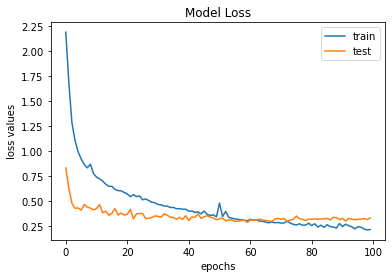

In [219]:
import matplotlib.pyplot as plt
plt.plot(train.history['loss'], label='train')
plt.plot(train.history['val_loss'], label='test')
plt.title('Model Loss')
plt.xlabel('epochs')
plt.ylabel('loss values')
plt.legend(loc='upper right')
plt.show()

Please note that in order to do not re-run the whole code again the below chart is for the accuracy values through the epochs. 

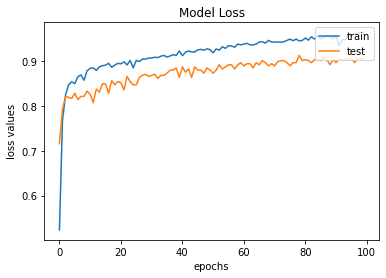

In [220]:
# plot loss during training
plt.plot(train.history['accuracy'], label='train')
plt.plot(train.history['val_accuracy'], label='test')
plt.title('Model Loss')
plt.xlabel('epochs')
plt.ylabel('loss values')
plt.legend(loc='upper right')
plt.show()

In [222]:
# Untunned Scores of the Model
import sklearn.metrics as metrics
y_pred=model.predict(X_test)

In [224]:
y_pred[0:3]

array([[1.0000000e+00, 3.4625838e-09, 2.2854537e-23],
       [1.0000000e+00, 1.1565938e-11, 2.8801834e-22],
       [9.9999857e-01, 1.4875867e-06, 6.9372025e-17]], dtype=float32)

In [223]:
y_pred.shape

(426, 3)

In [225]:
y_test.shape

(426, 3)

In [229]:
y_test

array([[1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       ...,
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.]], dtype=float32)

In [230]:
y_pred = np.argmax(y_pred, axis=1)

In [231]:
y_test = np.argmax(y_test, axis=1)

In [227]:
import numpy as np 

In [232]:
# %%Accuracy
print("Accuracy:",metrics.accuracy_score(y_test,y_pred))

Accuracy: 0.903755868544601


# In a standard F1 score, all classes are given equal importance. However, in a weighted F1 score, we assign different weights to different classes based on their importance. This is particularly useful when dealing with imbalanced datasets where we want to give more importance to the minority class.

In [233]:
# %%f1 score

print("f1_weighted:",metrics.f1_score(y_test, y_pred,average='weighted'))

f1_weighted: 0.9070324879666184


In [234]:
# Grid Search Cross Validation
# GridSearch Cross Validation Parameters
param_grid = {
   
    'epochs': [50,100,150], 
    'batch_size':[32,50,100],
    'optimizer':['RMSprop', 'Adam','SGD'],
    
}

In [235]:
# create model

# Creating Model Object with KerasClassifier
model_cv = KerasClassifier(build_fn=create_model, verbose=1)

In [236]:
grid = GridSearchCV(estimator=model_cv,  
                    n_jobs=-1, 
                    verbose=1,
                    cv=5,
                    param_grid=param_grid)

In [238]:
X_train.shape

(1700, 23)

In [237]:
grid_cv_model = grid.fit(X_train, y_train,) # Fitting the GridSearch Object on the Train Set

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Epoch 1/100
17/17 [==============================] - 0s 2ms/step - loss: 0.8919 - accuracy: 0.6276
Epoch 2/100
17/17 [==============================] - 0s 2ms/step - loss: 0.6330 - accuracy: 0.7818
Epoch 3/100
17/17 [==============================] - 0s 1ms/step - loss: 0.5696 - accuracy: 0.7818
Epoch 4/100
17/17 [==============================] - 0s 973us/step - loss: 0.4982 - accuracy: 0.7859
Epoch 5/100
17/17 [==============================] - 0s 2ms/step - loss: 0.4338 - accuracy: 0.8224
Epoch 6/100
17/17 [==============================] - 0s 980us/step - loss: 0.3799 - accuracy: 0.8476
Epoch 7/100
17/17 [==============================] - 0s 974us/step - loss: 0.3423 - accuracy: 0.8653
Epoch 8/100
17/17 [==============================] - 0s 977us/step - loss: 0.3150 - accuracy: 0.8759
Epoch 9/100
17/17 [==============================] - 0s 975us/step - loss: 0.2954 - accuracy: 0.8812
Epoch 10/100
17/17 [=================

In [239]:
means = grid_cv_model.cv_results_['mean_test_score'] # Mean of test scores
stds = grid_cv_model.cv_results_['std_test_score'] # standard deviations of test scores
params = grid_cv_model.cv_results_['params'] # parameters used
# to print all scores, standard deviations and parameters used
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

0.913529 (0.010783) with: {'batch_size': 32, 'epochs': 50, 'optimizer': 'RMSprop'}
0.916471 (0.007579) with: {'batch_size': 32, 'epochs': 50, 'optimizer': 'Adam'}
0.880588 (0.012141) with: {'batch_size': 32, 'epochs': 50, 'optimizer': 'SGD'}
0.919412 (0.011557) with: {'batch_size': 32, 'epochs': 100, 'optimizer': 'RMSprop'}
0.914706 (0.009301) with: {'batch_size': 32, 'epochs': 100, 'optimizer': 'Adam'}
0.899412 (0.011068) with: {'batch_size': 32, 'epochs': 100, 'optimizer': 'SGD'}
0.915882 (0.024859) with: {'batch_size': 32, 'epochs': 150, 'optimizer': 'RMSprop'}
0.914706 (0.016323) with: {'batch_size': 32, 'epochs': 150, 'optimizer': 'Adam'}
0.903529 (0.013465) with: {'batch_size': 32, 'epochs': 150, 'optimizer': 'SGD'}
0.911765 (0.013795) with: {'batch_size': 50, 'epochs': 50, 'optimizer': 'RMSprop'}
0.914118 (0.011527) with: {'batch_size': 50, 'epochs': 50, 'optimizer': 'Adam'}
0.865882 (0.011998) with: {'batch_size': 50, 'epochs': 50, 'optimizer': 'SGD'}
0.918235 (0.021963) with: 

In [240]:
# Printing the Best Parameters as a Result of Grid Search Cross Validation on the Screen
print("Best: %f using %s" % (grid_cv_model.best_score_, grid_cv_model.best_params_))

Best: 0.920588 using {'batch_size': 100, 'epochs': 100, 'optimizer': 'Adam'}


In [241]:
grid_cv_model.best_estimator_

In [242]:
# %% Model Tuning- Building a Tuned Model with Best Parameters
# Creating Tuned Model Object with KerasClassifier
cv_model = grid_cv_model.best_estimator_

K-fold Cross-Validation is when the dataset is split into a K number of folds and is used to evaluate the model's ability when given new data. K refers to the number of groups the data sample is split into

In [243]:
#%% K-FOLD
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
# K-fold accuracy scores

In this case the data is split in 5 different folders. 

In [245]:
kfold = KFold(n_splits=5, shuffle=True)
results = cross_val_score(cv_model, X_test, y_test, cv=kfold,scoring= 'accuracy')

Epoch 1/100
4/4 [==============================] - 0s 2ms/step - loss: 1.3523 - accuracy: 0.0853
Epoch 2/100
4/4 [==============================] - 0s 1ms/step - loss: 1.0506 - accuracy: 0.3382
Epoch 3/100
4/4 [==============================] - 0s 2ms/step - loss: 0.8505 - accuracy: 0.7647
Epoch 4/100
4/4 [==============================] - 0s 3ms/step - loss: 0.7471 - accuracy: 0.7647
Epoch 5/100
4/4 [==============================] - 0s 4ms/step - loss: 0.7135 - accuracy: 0.7647
Epoch 6/100
4/4 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.7647
Epoch 7/100
4/4 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.7647
Epoch 8/100
4/4 [==============================] - 0s 3ms/step - loss: 0.6759 - accuracy: 0.7647
Epoch 9/100
4/4 [==============================] - 0s 3ms/step - loss: 0.6686 - accuracy: 0.7647
Epoch 10/100
4/4 [==============================] - 0s 3ms/step - loss: 0.6594 - accuracy: 0.7647
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 2ms/step - loss: 0.2062 - accuracy: 0.9120
Epoch 68/100
4/4 [==============================] - 0s 2ms/step - loss: 0.2049 - accuracy: 0.9120
Epoch 69/100
4/4 [==============================] - 0s 3ms/step - loss: 0.2037 - accuracy: 0.9091
Epoch 70/100
4/4 [==============================] - 0s 2ms/step - loss: 0.2027 - accuracy: 0.9091
Epoch 71/100
4/4 [==============================] - 0s 2ms/step - loss: 0.2012 - accuracy: 0.9091
Epoch 72/100
4/4 [==============================] - 0s 3ms/step - loss: 0.1991 - accuracy: 0.9120
Epoch 73/100
4/4 [==============================] - 0s 2ms/step - loss: 0.1975 - accuracy: 0.9150
Epoch 74/100
4/4 [==============================] - 0s 4ms/step - loss: 0.1964 - accuracy: 0.9179
Epoch 75/100
4/4 [==============================] - 0s 3ms/step - loss: 0.1948 - accuracy: 0.9150
Epoch 76/100
4/4 [==============================] - 0s 2ms/step - loss: 0.1938 - accuracy: 0.9120
Epoch 77/100
4/4 [===============

4/4 [==============================] - 0s 2ms/step - loss: 0.3644 - accuracy: 0.8563
Epoch 34/100
4/4 [==============================] - 0s 1ms/step - loss: 0.3543 - accuracy: 0.8622
Epoch 35/100
4/4 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8680
Epoch 36/100
4/4 [==============================] - 0s 4ms/step - loss: 0.3384 - accuracy: 0.8680
Epoch 37/100
4/4 [==============================] - 0s 2ms/step - loss: 0.3312 - accuracy: 0.8651
Epoch 38/100
4/4 [==============================] - 0s 2ms/step - loss: 0.3253 - accuracy: 0.8651
Epoch 39/100
4/4 [==============================] - 0s 337us/step - loss: 0.3190 - accuracy: 0.8651
Epoch 40/100
4/4 [==============================] - 0s 5ms/step - loss: 0.3145 - accuracy: 0.8680
Epoch 41/100
4/4 [==============================] - 0s 0s/step - loss: 0.3094 - accuracy: 0.8739
Epoch 42/100
4/4 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8768
Epoch 43/100
4/4 [==============

4/4 [==============================] - 0s 0s/step - loss: 0.1547 - accuracy: 0.9355
Epoch 93/100
4/4 [==============================] - 0s 6ms/step - loss: 0.1539 - accuracy: 0.9355
Epoch 94/100
4/4 [==============================] - 0s 0s/step - loss: 0.1523 - accuracy: 0.9384
Epoch 95/100
4/4 [==============================] - 0s 246us/step - loss: 0.1511 - accuracy: 0.9413
Epoch 96/100
4/4 [==============================] - 0s 5ms/step - loss: 0.1505 - accuracy: 0.9384
Epoch 97/100
4/4 [==============================] - 0s 0s/step - loss: 0.1475 - accuracy: 0.9384
Epoch 98/100
4/4 [==============================] - 0s 6ms/step - loss: 0.1487 - accuracy: 0.9443
Epoch 99/100
4/4 [==============================] - 0s 4ms/step - loss: 0.1467 - accuracy: 0.9443
Epoch 100/100
4/4 [==============================] - 0s 2ms/step - loss: 0.1459 - accuracy: 0.9443


In [246]:
print('K-fold Cross Validation f1_weighted Results: ', results)
print('K-fold Cross Validation f1_weighted Results Mean: ', results.mean())

K-fold Cross Validation f1_weighted Results:  [0.93023256 0.87058824 0.92941176 0.88235294 0.84705882]
K-fold Cross Validation f1_weighted Results Mean:  0.8919288645690834


In [247]:
# Tuned Model Prediction
y_pred = cv_model.predict(X_test)

In [248]:
y_pred

array([0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 2, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 2, 1, 1, 0, 0, 2, 1,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 2, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 2, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0,
       0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 1, 0, 0, 0, 0, 0, 0, 2, 1,
       0, 2, 1, 0, 2, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0,
       0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 2, 1, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 2, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 2, 0, 2, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 2, 0, 1, 0, 1, 0, 1, 0, 0, 2, 0, 2, 2, 0,

In [249]:
y_test

array([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 2, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 2, 1, 1, 0, 0, 2, 1,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 1, 2, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 2, 0, 0, 0, 0, 0, 0, 2, 2,
       0, 2, 0, 1, 2, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0,
       1, 0, 2, 0, 0, 0, 0, 1, 2, 0, 0, 1, 0, 0, 0, 0, 2, 1, 0, 0, 1, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 2, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 2, 0, 2, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 2, 1, 1, 0, 1, 0, 2, 0, 0, 2, 0, 2, 2, 0,

In [250]:
import sklearn.metrics as metrics

In [253]:
# %% f1 score
print("f1_weighted:",metrics.f1_score(y_test, y_pred,average='weighted'))
# %% Accuracy
print("accuracy:",metrics.accuracy_score(y_test, y_pred))

f1_weighted: 0.9121143501872631
accuracy: 0.9107981220657277


previous model scores without the gridsearch: 
Accuracy: 0.903755868544601
f1_weighted: 0.9070324879666184
parameter tuning improved the scores. 

In [254]:
#%% Confusion Matrix and Classification Report
from sklearn.metrics import confusion_matrix, classification_report 

In [255]:
# Classification Report
model_report = classification_report(y_test, y_pred)
print(model_report)

              precision    recall  f1-score   support

           0       0.96      0.95      0.95       326
           1       0.69      0.76      0.72        58
           2       0.90      0.83      0.86        42

    accuracy                           0.91       426
   macro avg       0.85      0.85      0.85       426
weighted avg       0.91      0.91      0.91       426



In [265]:
class_names = ['1','2','3']

In [266]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

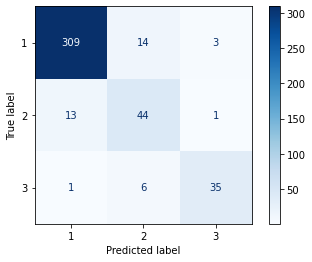

In [267]:
cm = confusion_matrix(y_test,y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [264]:
#remember that the classes comes from: 
#3 different classes. 
df["NSP"].value_counts()

1.0    1655
2.0     295
3.0     176
Name: NSP, dtype: int64

# Makes sense with the distribution of data in the confusion matrix. 

# House Sales Regression - TF2 Keras

https://www.kaggle.com/code/tanyildizderya/house-sales-regression-tf2-keras/notebook

In [268]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [269]:
df = pd.read_csv("C:/Users/Admin/Machine Learning chapter 5/kc_house_data.csv")

In [270]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180.0,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170.0,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770.0,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050.0,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680.0,0,1987,0,98074,47.6168,-122.045,1800,7503


In [271]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21611 non-null  float64
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [272]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       2
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [273]:
df = df.dropna()

In [274]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [275]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21611.0,4.580327e+09,2.876592e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21611.0,5.400850e+05,3.671430e+05,7.500000e+04,3.217250e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21611.0,3.370830e+00,9.300916e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21611.0,2.114791e+00,7.701570e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21611.0,2.079853e+03,9.184224e+02,2.900000e+02,1.426000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21611.0,1.510771e+04,4.142235e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068850e+04,1.651359e+06
floors,21611.0,1.494332e+00,5.400034e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21611.0,7.542455e-03,8.652117e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21611.0,2.343251e-01,7.663497e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21611.0,3.409421e+00,6.507548e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


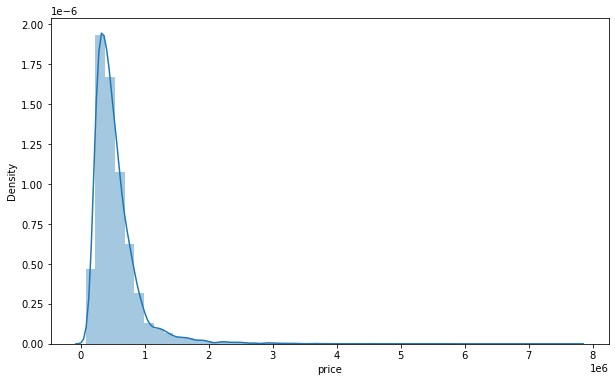

In [276]:
plt.figure(figsize=(10,6))
sns.distplot(df["price"]);

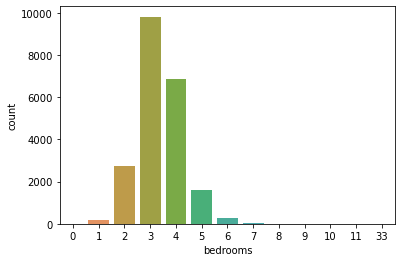

In [277]:
sns.countplot(df["bedrooms"]);

In [278]:
df.corr()["price"].sort_values()

zipcode         -0.053182
id              -0.016742
long             0.021613
condition        0.036379
yr_built         0.054006
sqft_lot15       0.082448
sqft_lot         0.089661
yr_renovated     0.126436
floors           0.256814
waterfront       0.266371
lat              0.307010
bedrooms         0.308366
sqft_basement    0.323842
view             0.397299
bathrooms        0.525150
sqft_living15    0.585377
sqft_above       0.605567
grade            0.667434
sqft_living      0.702055
price            1.000000
Name: price, dtype: float64

we can see from here that what matters the most for the price is sqft_living      

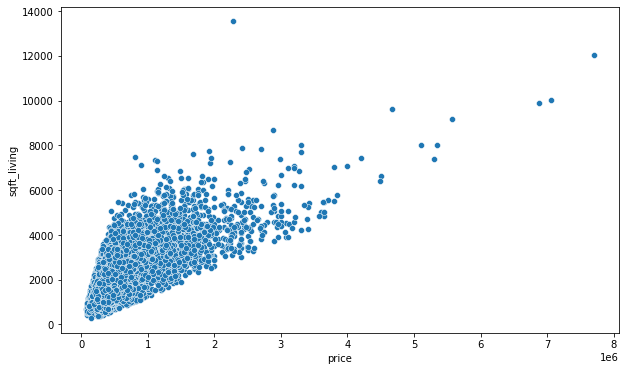

In [279]:
plt.figure(figsize=(10,6))
sns.scatterplot(x="price",y="sqft_living",data=df);

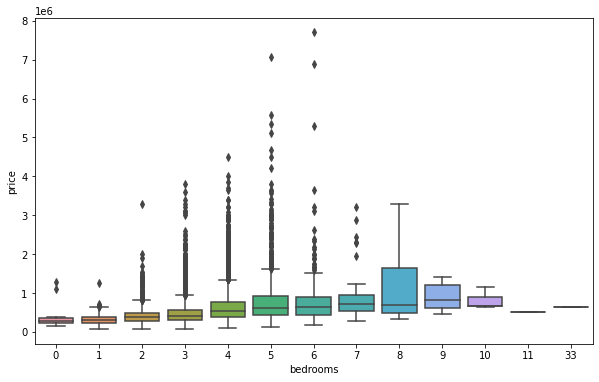

In [280]:
plt.figure(figsize=(10,6))
sns.boxplot(x="bedrooms",y="price",data=df);

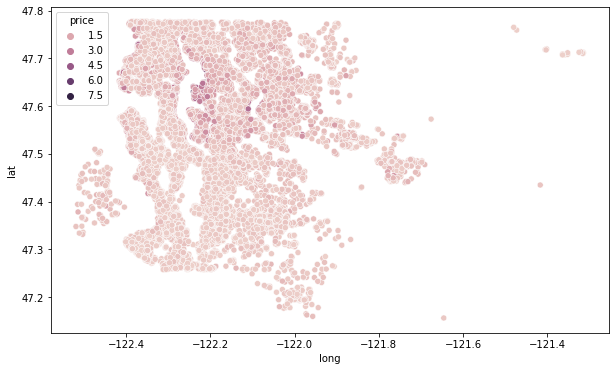

In [282]:
plt.figure(figsize=(10,6))
sns.scatterplot(x="long",y="lat",data=df,hue="price");

In [283]:
df.sort_values("price",ascending=False).head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7252,6762700020,20141013T000000,7700000.0,6,8.00,12050,27600,2.5,0,3,4,13,8570.0,3480,1910,1987,98102,47.6298,-122.323,3940,8800
3914,9808700762,20140611T000000,7062500.0,5,4.50,10040,37325,2.0,1,2,3,11,7680.0,2360,1940,2001,98004,47.6500,-122.214,3930,25449
9254,9208900037,20140919T000000,6885000.0,6,7.75,9890,31374,2.0,0,4,3,13,8860.0,1030,2001,0,98039,47.6305,-122.240,4540,42730
4411,2470100110,20140804T000000,5570000.0,5,5.75,9200,35069,2.0,0,0,3,13,6200.0,3000,2001,0,98039,47.6289,-122.233,3560,24345
1448,8907500070,20150413T000000,5350000.0,5,5.00,8000,23985,2.0,0,4,3,12,6720.0,1280,2009,0,98004,47.6232,-122.220,4600,21750
1315,7558700030,20150413T000000,5300000.0,6,6.00,7390,24829,2.0,1,4,4,12,5000.0,2390,1991,0,98040,47.5631,-122.210,4320,24619
1164,1247600105,20141020T000000,5110800.0,5,5.25,8010,45517,2.0,1,4,3,12,5990.0,2020,1999,0,98033,47.6767,-122.211,3430,26788
8092,1924059029,20140617T000000,4668000.0,5,6.75,9640,13068,1.0,1,4,3,12,4820.0,4820,1983,2009,98040,47.5570,-122.210,3270,10454
2626,7738500731,20140815T000000,4500000.0,5,5.50,6640,40014,2.0,1,4,3,12,6350.0,290,2004,0,98155,47.7493,-122.280,3030,23408
8638,3835500195,20140618T000000,4489000.0,4,3.00,6430,27517,2.0,0,0,3,12,6430.0,0,2001,0,98004,47.6208,-122.219,3720,14592


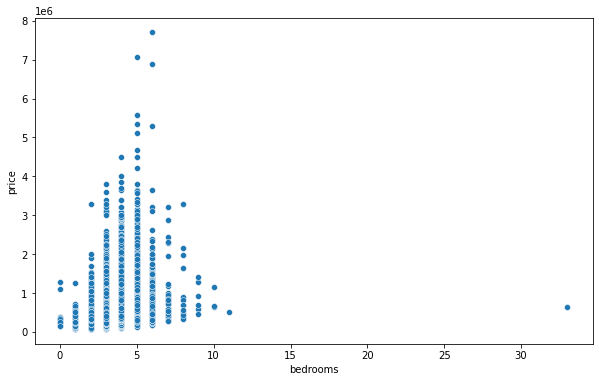

In [286]:
#multiple prices regardless the number of bedrooms. 
plt.figure(figsize=(10,6))
sns.scatterplot(x="bedrooms",y="price",data=df);

In [287]:
#top prices 10% 
len(df)*0.01

216.11

In [288]:
non_top_one_percent = df.sort_values("price",ascending=False).iloc[216:]

In [ ]:
the most 

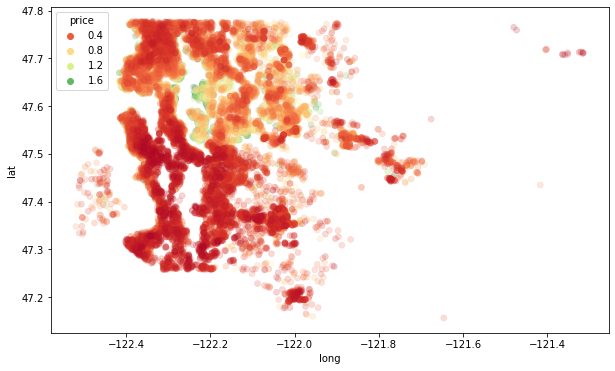

In [289]:
plt.figure(figsize=(10,6))
sns.scatterplot(x="long",y="lat",data=non_top_one_percent,edgecolor=None,hue="price",alpha=0.2,palette='RdYlGn');

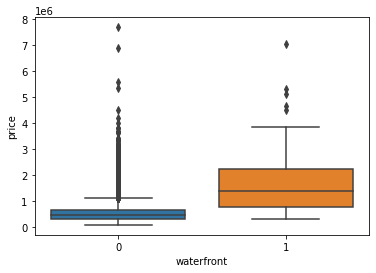

In [290]:
sns.boxplot(x="waterfront",y="price",data=df);

In [291]:
df.drop('id',axis=1,inplace=True)

In [292]:
df["date"] = pd.to_datetime(df["date"])

In [293]:
df["year"] = df["date"].apply(lambda date: date.year)
df["month"] = df["date"].apply(lambda date: date.month)

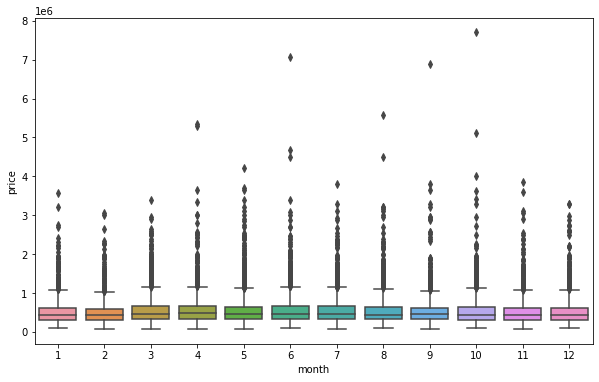

In [294]:
plt.figure(figsize=(10,6))
sns.boxplot(x="month",y="price",data=df);

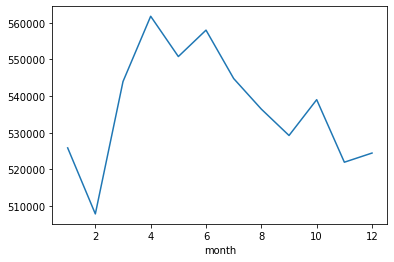

In [296]:
df.groupby('month').mean()["price"].plot();

In [297]:
df['year'].nunique()

2

In [298]:
df['year'].value_counts()

2014    14632
2015     6979
Name: year, dtype: int64

In [299]:
df.drop("date",axis=1,inplace=True)

In [300]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180.0,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,10
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170.0,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770.0,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,2
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050.0,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,12
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680.0,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,2


In [301]:
df.drop("zipcode",axis=1,inplace=True)

# Starting the Model: 

In [302]:
X = df.drop("price",axis=1).values
y = df["price"].values

In [303]:
from sklearn.model_selection import train_test_split

In [304]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=101)

In [305]:
from sklearn.preprocessing import MinMaxScaler

In [306]:
scaler = MinMaxScaler()

In [307]:
X_train = scaler.fit_transform(X_train)

In [308]:
X_test = scaler.transform(X_test)

In [309]:
X_train.shape

(15127, 19)

In [310]:
y_train.shape

(15127,)

In [311]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [316]:
model = Sequential()
model.add(Dense(19,activation="relu"))
model.add(Dense(19,activation="relu"))
model.add(Dense(19,activation="relu"))
model.add(Dense(19,activation="relu"))
model.add(Dense(1))
model.compile(optimizer="adam",loss="mse")

In [317]:
model.fit(x=X_train,y=y_train,validation_data=(X_test,y_test),batch_size=128,epochs=250)

Epoch 1/250
119/119 [==============================] - 1s 2ms/step - loss: 426885021696.0000 - val_loss: 425409249280.0000
Epoch 2/250
119/119 [==============================] - 0s 2ms/step - loss: 425505390592.0000 - val_loss: 420546117632.0000
Epoch 3/250
119/119 [==============================] - 0s 2ms/step - loss: 406774906880.0000 - val_loss: 377750355968.0000
Epoch 4/250
119/119 [==============================] - 0s 2ms/step - loss: 320620855296.0000 - val_loss: 241353359360.0000
Epoch 5/250
119/119 [==============================] - 0s 2ms/step - loss: 168514748416.0000 - val_loss: 111663677440.0000
Epoch 6/250
119/119 [==============================] - 0s 2ms/step - loss: 104858550272.0000 - val_loss: 98525200384.0000
Epoch 7/250
119/119 [==============================] - 0s 1ms/step - loss: 100871282688.0000 - val_loss: 96946257920.0000
Epoch 8/250
119/119 [==============================] - 0s 2ms/step - loss: 99256131584.0000 - val_loss: 95379423232.0000
Epoch 9/250
119/119 

Epoch 135/250
119/119 [==============================] - 0s 2ms/step - loss: 32683966464.0000 - val_loss: 33400039424.0000
Epoch 136/250
119/119 [==============================] - 0s 2ms/step - loss: 32645167104.0000 - val_loss: 33359763456.0000
Epoch 137/250
119/119 [==============================] - 0s 2ms/step - loss: 32614275072.0000 - val_loss: 33345019904.0000
Epoch 138/250
119/119 [==============================] - 0s 2ms/step - loss: 32531879936.0000 - val_loss: 33319665664.0000
Epoch 139/250
119/119 [==============================] - 0s 1ms/step - loss: 32516751360.0000 - val_loss: 33275699200.0000
Epoch 140/250
119/119 [==============================] - 0s 1ms/step - loss: 32472229888.0000 - val_loss: 33284818944.0000
Epoch 141/250
119/119 [==============================] - 0s 2ms/step - loss: 32425504768.0000 - val_loss: 33242990592.0000
Epoch 142/250
119/119 [==============================] - 0s 1ms/step - loss: 32402520064.0000 - val_loss: 33217259520.0000
Epoch 143/250
11

In [318]:
lossess = pd.DataFrame(model.history.history)

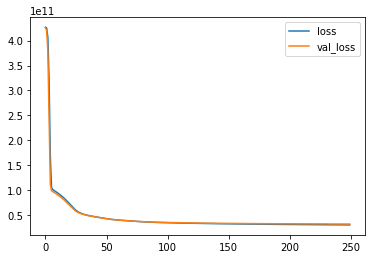

In [319]:
lossess.plot();

In [320]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score

In [321]:
predictions = model.predict(X_test)

In [322]:
mean_squared_error(y_test,predictions)

31709963704.27247

In [323]:
np.sqrt(mean_squared_error(y_test,predictions))

178072.91681856752

In [324]:
mean_absolute_error(y_test,predictions)

106476.37699740467

In [325]:
df["price"].describe().T

count    2.161100e+04
mean     5.400850e+05
std      3.671430e+05
min      7.500000e+04
25%      3.217250e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

In [326]:
explained_variance_score(y_test,predictions)

0.7622632208901229

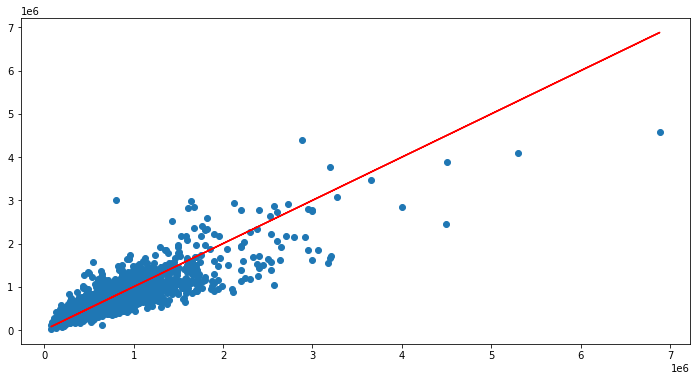

In [327]:
plt.figure(figsize=(12,6))
plt.scatter(y_test,predictions)
plt.plot(y_test,y_test,"r");

In [328]:
#only the first row. 
single_house = df.drop("price",axis=1).iloc[0]

In [330]:
single_house.shape

(19,)

In [331]:
single_house = scaler.transform(single_house.values.reshape(-1,19))

In [332]:
single_house.shape

(1, 19)

In [333]:
single_house

array([[0.27272727, 0.125     , 0.06716981, 0.00310751, 0.        ,
        0.        , 0.        , 0.5       , 0.5       , 0.09758772,
        0.        , 0.47826087, 0.        , 0.57149751, 0.21778886,
        0.16193426, 0.00573322, 0.        , 0.81818182]])

In [334]:
model.predict(single_house)

array([[281851.53]], dtype=float32)

In [335]:
df.head(1)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,year,month
0,221900.0,3,1.0,1180,5650,1.0,0,0,3,7,1180.0,0,1955,0,47.5112,-122.257,1340,5650,2014,10


prediction  = 281.851.53
real_price = 221.900.0

source: https://www.kaggle.com/code/aminizahra/regression-in-keras/notebook

In [336]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

In [337]:
import keras
from keras.models import Sequential
from keras.layers import Dense
# from keras.utils import to_categorical
from tensorflow.keras.utils import to_categorical

In [338]:
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [339]:
from sklearn.metrics import mean_squared_error

# Import DATA

In [376]:
data = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/concrete_data.csv')

In [377]:
data.head()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


# X and y arrays

In [378]:
X = data.drop(['Strength'], axis=1)
y = data[['Strength']]

In [379]:
X

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360
...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28


In [380]:
y

,Strength
0,79.99
1,61.89
2,40.27
3,41.05
4,44.30
...,...
1025,44.28
1026,31.18
1027,23.70
1028,32.77


In [381]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [382]:
X_train.shape

(721, 8)

The kernel_initializer parameter is set to RandomNormal, with a mean of 0.0 and a standard deviation of 0.05, which will initialize the layer's weights with random values drawn from a normal distribution with these parameters.

In [383]:
def regression_model():
    # create model
    model = Sequential()
    model.add(Dense(10, input_dim=8, activation='relu'))
    model.add(Dense(1, kernel_initializer='normal',activation = 'linear'))
    # Compile model
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

In [384]:
model = regression_model()

In [385]:
model.fit(X_train, y_train, epochs=50)

Epoch 1/50
23/23 [==============================] - 0s 1ms/step - loss: 1369.5927
Epoch 2/50
23/23 [==============================] - 0s 1ms/step - loss: 333.8002
Epoch 3/50
23/23 [==============================] - 0s 970us/step - loss: 296.0063
Epoch 4/50
23/23 [==============================] - 0s 917us/step - loss: 282.3640
Epoch 5/50
23/23 [==============================] - 0s 1ms/step - loss: 276.5185
Epoch 6/50
23/23 [==============================] - 0s 1ms/step - loss: 269.5546
Epoch 7/50
23/23 [==============================] - 0s 920us/step - loss: 263.7905
Epoch 8/50
23/23 [==============================] - 0s 2ms/step - loss: 258.3227
Epoch 9/50
23/23 [==============================] - 0s 1ms/step - loss: 252.6509
Epoch 10/50
23/23 [==============================] - 0s 2ms/step - loss: 247.3779
Epoch 11/50
23/23 [==============================] - 0s 2ms/step - loss: 243.1140
Epoch 12/50
23/23 [==============================] - 0s 1ms/step - loss: 238.1284
Epoch 13/50
23/23 

In [386]:
y_pred = model.predict(X_test)

In [387]:
RMSE = np.sqrt(mean_squared_error(y_test,y_pred))
RMSE

10.026710276357884

In [388]:
model.summary()

Model: "sequential_115"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_259 (Dense)           (None, 10)                90        
                                                                 
 dense_260 (Dense)           (None, 1)                 11        
                                                                 
Total params: 101
Trainable params: 101
Non-trainable params: 0
_________________________________________________________________


dense_53 (Dense)  = 8*10 = 80 weights + 10 biases = 90 params
dense_54 (Dense) = 1*10 = 10 weights + 1 biases = 11 params

Repeat steps 50 times, i.e., create a list of 50 mean squared errors.

In [390]:
RMSE_List = []
for i in range(50):
    #1-Split Data:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    model = regression_model()
    #2-Train:
    model.fit(X_train, y_train, epochs=50, verbose=0)
    
    #Prediction:
    y_pred = model.predict(X_test)
    
    #3-Evaluate_Model:
    result = np.sqrt(mean_squared_error(y_test,y_pred))
    print("{}: sqrt(mse) = {}".format(i+1,result))
    RMSE_List.append(result)
    print("***_________________________________***\n\n\n")

1: sqrt(mse) = 9.014576333635652
***_________________________________***



2: sqrt(mse) = 11.416084178631472
***_________________________________***



3: sqrt(mse) = 8.736372056173105
***_________________________________***



4: sqrt(mse) = 8.821702112633286
***_________________________________***



5: sqrt(mse) = 8.58709516469829
***_________________________________***



6: sqrt(mse) = 10.698183416722303
***_________________________________***



7: sqrt(mse) = 10.723185903509073
***_________________________________***



8: sqrt(mse) = 10.524924543245799
***_________________________________***



9: sqrt(mse) = 9.419580861334357
***_________________________________***



10: sqrt(mse) = 10.725316565220698
***_________________________________***



11: sqrt(mse) = 13.72807006800625
***_________________________________***



12: sqrt(mse) = 9.321340962028584
***_________________________________***



13: sqrt(mse) = 11.014689192675831
***_________________________________***



14:

In [391]:
RMSE_List

[9.014576333635652,
 11.416084178631472,
 8.736372056173105,
 8.821702112633286,
 8.58709516469829,
 10.698183416722303,
 10.723185903509073,
 10.524924543245799,
 9.419580861334357,
 10.725316565220698,
 13.72807006800625,
 9.321340962028584,
 11.014689192675831,
 9.03868022916415,
 9.78661522359333,
 10.895245718206896,
 10.218196405438881,
 10.321437966588567,
 10.141431132772656,
 10.350533470282732,
 8.767734509838023,
 10.259888683367956,
 10.696469036462801,
 8.703700869039205,
 11.371796028057808,
 9.567663771253303,
 8.866859301897085,
 10.618365783766226,
 11.445166778519983,
 9.425108918169384,
 11.042646435576312,
 11.91995949869393,
 8.084139524710736,
 10.437332682980754,
 9.602529681483635,
 12.988779171403735,
 11.894396515897306,
 11.717340872888146,
 9.810456118720392,
 10.690378157161234,
 10.08955604558218,
 8.637869959360684,
 10.982917101973133,
 9.431522504764343,
 9.176041239480695,
 10.69596488747428,
 10.473485414269817,
 8.990915474230707,
 11.172662909899524

In [392]:
len(RMSE_List)

50

In [394]:
# Calculate the mean and the standard deviation of the metric on the 50 samplings
mean_rmse_A = np.mean(RMSE_List)
std_rmse_A  = np.std(RMSE_List)

In [395]:
# Generate a data frame to store the results of the differents parts of this project
df_results = pd.DataFrame.from_dict({"Part": ["A"],"mean_sq_mse": [mean_rmse_A], "std_sq_mse": [std_rmse_A]})
df_results

,Part,mean_sq_mse,std_sq_mse
0,A,10.238437,1.158468


# Part B

B. Normalize the data

In [396]:
from sklearn import preprocessing

In [397]:
X = preprocessing.normalize(X)
y = preprocessing.normalize(y, axis = 0)

In [398]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [399]:
#same shape but values were normalized. 
X_train.shape

(721, 8)

In [400]:
model = regression_model()

In [401]:
model.fit(X_train, y_train, epochs=50)

Epoch 1/50
23/23 [==============================] - 0s 1ms/step - loss: 7.6452e-04
Epoch 2/50
23/23 [==============================] - 0s 1ms/step - loss: 1.9804e-04
Epoch 3/50
23/23 [==============================] - 0s 1ms/step - loss: 1.5593e-04
Epoch 4/50
23/23 [==============================] - 0s 1ms/step - loss: 1.4938e-04
Epoch 5/50
23/23 [==============================] - 0s 2ms/step - loss: 1.4528e-04
Epoch 6/50
23/23 [==============================] - 0s 2ms/step - loss: 1.4019e-04
Epoch 7/50
23/23 [==============================] - 0s 2ms/step - loss: 1.3205e-04
Epoch 8/50
23/23 [==============================] - 0s 2ms/step - loss: 1.3135e-04
Epoch 9/50
23/23 [==============================] - 0s 1ms/step - loss: 1.2034e-04
Epoch 10/50
23/23 [==============================] - 0s 1ms/step - loss: 1.1458e-04
Epoch 11/50
23/23 [==============================] - 0s 1ms/step - loss: 1.0832e-04
Epoch 12/50
23/23 [==============================] - 0s 1ms/step - loss: 1.0335e-04
E

In [402]:
y_pred = model.predict(X_test)

In [403]:
RMSE = np.sqrt(mean_squared_error(y_test,y_pred))
RMSE

0.007633150819269824

In [406]:
RMSE_List = []
for i in range(50):
    #1-Split Data:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    model = regression_model()
    #2-Train:
    model.fit(X_train, y_train, epochs=50, verbose=0)
    
    #Prediction:
    y_pred = model.predict(X_test)
    
    #3-Evaluate_Model:
    result = np.sqrt(mean_squared_error(y_test,y_pred))
    print("{}: sqrt(mse) = {}".format(i+1,result))
    RMSE_List.append(result)
    print("***_________________________________***\n\n\n")

1: sqrt(mse) = 0.008019928892802288
***_________________________________***



2: sqrt(mse) = 0.009572499146229565
***_________________________________***



3: sqrt(mse) = 0.0083218862378541
***_________________________________***



4: sqrt(mse) = 0.00729818576644821
***_________________________________***



5: sqrt(mse) = 0.007834300852377208
***_________________________________***



6: sqrt(mse) = 0.01018369980035225
***_________________________________***



7: sqrt(mse) = 0.00919411248912022
***_________________________________***



8: sqrt(mse) = 0.008019159839260026
***_________________________________***



9: sqrt(mse) = 0.008985282719165684
***_________________________________***



10: sqrt(mse) = 0.008876737920659067
***_________________________________***



11: sqrt(mse) = 0.009566576877742795
***_________________________________***



12: sqrt(mse) = 0.006409537778104244
***_________________________________***



13: sqrt(mse) = 0.008931568688457828
***______________

In [407]:
RMSE_List

[0.008019928892802288,
 0.009572499146229565,
 0.0083218862378541,
 0.00729818576644821,
 0.007834300852377208,
 0.01018369980035225,
 0.00919411248912022,
 0.008019159839260026,
 0.008985282719165684,
 0.008876737920659067,
 0.009566576877742795,
 0.006409537778104244,
 0.008931568688457828,
 0.008998961885346704,
 0.006596819661884136,
 0.009103086006912703,
 0.00849353931391734,
 0.008494680878169876,
 0.00767883021707509,
 0.007386594223950336,
 0.008662344277668528,
 0.006946337589247574,
 0.006734940404562317,
 0.009191992284023365,
 0.007052560259047795,
 0.007801216445490073,
 0.008688269294186705,
 0.007418506540513581,
 0.008636946320618103,
 0.007745605632261634,
 0.008617580735336052,
 0.007241510131783899,
 0.008310570942998386,
 0.008625245561638368,
 0.008761135117943969,
 0.0077138234268913294,
 0.007922561012133112,
 0.007468946991895852,
 0.0070571013564521305,
 0.008379441961343673,
 0.008565226108915837,
 0.007544502310164555,
 0.009483811606314082,
 0.0087008869062

In [408]:
# Calculate the mean and the standard deviation of the metric on the 50 samplings
mean_sqmse_B = np.mean(RMSE_List)
std_sqmse_B  = np.std(RMSE_List)

In [409]:
# Generate a data frame to store the results of the differents parts of this project
df_results = pd.DataFrame.from_dict({"Part": ["B"],"mean_sq_mse": [mean_sqmse_B], "std_sq_mse": [std_sqmse_B]})
df_results

,Part,mean_sq_mse,std_sq_mse
0,B,0.008134,0.000898


B.Q: How does the mean of the mean squared errors compare to that from Step A?
Because of normalized data, mean of mse and std of rmse have both become very small.

Part C¶
C. Increate the number of epochs

Repeat Part B but use 100 epochs this time for training.

In [411]:
model = regression_model()

In [412]:
model.fit(X_train, y_train, epochs=100)

Epoch 1/100
23/23 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2/100
23/23 [==============================] - 0s 1ms/step - loss: 2.3348e-04
Epoch 3/100
23/23 [==============================] - 0s 979us/step - loss: 1.6108e-04
Epoch 4/100
23/23 [==============================] - 0s 1ms/step - loss: 1.5828e-04
Epoch 5/100
23/23 [==============================] - 0s 1ms/step - loss: 1.5464e-04
Epoch 6/100
23/23 [==============================] - 0s 679us/step - loss: 1.5261e-04
Epoch 7/100
23/23 [==============================] - 0s 914us/step - loss: 1.4998e-04
Epoch 8/100
23/23 [==============================] - 0s 1ms/step - loss: 1.4618e-04
Epoch 9/100
23/23 [==============================] - 0s 1ms/step - loss: 1.4090e-04
Epoch 10/100
23/23 [==============================] - 0s 1ms/step - loss: 1.3522e-04
Epoch 11/100
23/23 [==============================] - 0s 1ms/step - loss: 1.2903e-04
Epoch 12/100
23/23 [==============================] - 0s 1ms/step - loss

In [413]:
y_pred = model.predict(X_test)

In [414]:
RMSE= np.sqrt(mean_squared_error(y_test,y_pred))
RMSE

0.006661463808661833

In [415]:
RMSE_List = []
for i in range(50):
    #1-Split Data:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    model = regression_model()
    #2-Train:
    model.fit(X_train, y_train, epochs=100, verbose=0)
    
    #Prediction:
    y_pred = model.predict(X_test)
    
    #3-Evaluate_Model:
    result = np.sqrt(mean_squared_error(y_test,y_pred))
    print("{}: sqrt(mse) = {}".format(i+1,result))
    RMSE_List.append(result)
    print("***_________________________________***\n\n\n")

1: sqrt(mse) = 0.006279551329046177
***_________________________________***



2: sqrt(mse) = 0.008095453677451535
***_________________________________***



3: sqrt(mse) = 0.007822344711002894
***_________________________________***



4: sqrt(mse) = 0.008477056905040635
***_________________________________***



5: sqrt(mse) = 0.005919026224205615
***_________________________________***



6: sqrt(mse) = 0.008240036212871423
***_________________________________***



7: sqrt(mse) = 0.008344924294423238
***_________________________________***



8: sqrt(mse) = 0.00643388156511419
***_________________________________***



9: sqrt(mse) = 0.008618645738884706
***_________________________________***



10: sqrt(mse) = 0.007868498963665092
***_________________________________***



11: sqrt(mse) = 0.0066069417838172705
***_________________________________***



12: sqrt(mse) = 0.006343474634602304
***_________________________________***



13: sqrt(mse) = 0.006767530976138544
***_________

In [417]:
RMSE_List

[0.006279551329046177,
 0.008095453677451535,
 0.007822344711002894,
 0.008477056905040635,
 0.005919026224205615,
 0.008240036212871423,
 0.008344924294423238,
 0.00643388156511419,
 0.008618645738884706,
 0.007868498963665092,
 0.0066069417838172705,
 0.006343474634602304,
 0.006767530976138544,
 0.006829524135607512,
 0.008328313732868261,
 0.006691798126014459,
 0.008151651549584141,
 0.008392619342598941,
 0.006615134402681197,
 0.0075435116551321475,
 0.006760315166020408,
 0.006718714674871372,
 0.006689641902018795,
 0.007745024680344286,
 0.008179519201207892,
 0.008571617050003278,
 0.006661958635180552,
 0.005879834601765933,
 0.00700007059925439,
 0.008225253429676685,
 0.006683995086234507,
 0.006930704547017917,
 0.006275119630700006,
 0.0067601571554161575,
 0.008547590378337315,
 0.007177722919236898,
 0.007110155701869992,
 0.007637854140662164,
 0.006599023483542479,
 0.00872129451612288,
 0.006193878381452619,
 0.008198009914046992,
 0.00642640402222663,
 0.006471161

C. Results
Report mean square MSE and std square MSE

In [418]:
# Calculate the mean and the standard deviation of the metric on the 50 samplings
mean_sqmse_C = np.mean(RMSE_List)
std_sqmse_C  = np.std(RMSE_List)

# Generate a data frame to store the results of the differents parts of this project
df_results = pd.DataFrame.from_dict({"Part": ["C"],"mean_sq_mse": [mean_sqmse_C], "std_sq_mse": [std_sqmse_C]})
df_results

,Part,mean_sq_mse,std_sq_mse
0,C,0.007311,0.000859


C.Q: How does the mean of the mean squared errors compare to that from Step B?
We had a decrease the mean_sq_mse and std_sq_mse slightly, which is good. 

Part D Increase the number of hidden layers

Repeat part B but use a neural network with the following instead:

Three hidden layers, each of 10 nodes and ReLU activation function.

In [419]:
def regression_model():
    # create model
    model = Sequential()
    model.add(Dense(10, input_dim=8, activation='relu'))
    model.add(Dense(10, input_dim=8, activation='relu'))
    model.add(Dense(10, input_dim=8, activation='relu'))
    model.add(Dense(1, kernel_initializer='normal',activation = 'linear'))
    # Compile model
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

In [420]:
model = regression_model()

In [421]:
model.fit(X_train, y_train, epochs=50)

Epoch 1/50
23/23 [==============================] - 0s 2ms/step - loss: 8.7152e-04
Epoch 2/50
23/23 [==============================] - 0s 1ms/step - loss: 1.8148e-04
Epoch 3/50
23/23 [==============================] - 0s 1ms/step - loss: 1.8105e-04
Epoch 4/50
23/23 [==============================] - 0s 1ms/step - loss: 1.7719e-04
Epoch 5/50
23/23 [==============================] - 0s 1ms/step - loss: 1.7585e-04
Epoch 6/50
23/23 [==============================] - 0s 1ms/step - loss: 1.7528e-04
Epoch 7/50
23/23 [==============================] - 0s 1ms/step - loss: 1.7396e-04
Epoch 8/50
23/23 [==============================] - 0s 1ms/step - loss: 1.7216e-04
Epoch 9/50
23/23 [==============================] - 0s 1ms/step - loss: 1.6883e-04
Epoch 10/50
23/23 [==============================] - 0s 2ms/step - loss: 1.6263e-04
Epoch 11/50
23/23 [==============================] - 0s 1ms/step - loss: 1.4915e-04
Epoch 12/50
23/23 [==============================] - 0s 1ms/step - loss: 1.2853e-04
E

In [422]:
y_pred = model.predict(X_test)

In [423]:
RMSE = np.sqrt(mean_squared_error(y_test,y_pred))
RMSE

0.008160015937060778

In [424]:
model.summary()

Model: "sequential_350"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_729 (Dense)           (None, 10)                90        
                                                                 
 dense_730 (Dense)           (None, 10)                110       
                                                                 
 dense_731 (Dense)           (None, 10)                110       
                                                                 
 dense_732 (Dense)           (None, 1)                 11        
                                                                 
Total params: 321
Trainable params: 321
Non-trainable params: 0
_________________________________________________________________


D. Repeat steps 1 - 3, 50 times, i.e., create a list of 50 mean squared errors.

In [426]:
RMSE_List = []
for i in range(50):
    #1-Split Data:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    model = regression_model()
    #2-Train:
    model.fit(X_train, y_train, epochs=50, verbose=0)
    
    #Prediction:
    y_pred = model.predict(X_test)
    
    #3-Evaluate_Model:
    result = np.sqrt(mean_squared_error(y_test,y_pred))
    print("{}: sqrt(mse) = {}".format(i+1,result))
    RMSE_List.append(result)
    print("***_________________________________***\n\n\n")

1: sqrt(mse) = 0.0069019641159020415
***_________________________________***



2: sqrt(mse) = 0.007259692362218798
***_________________________________***



3: sqrt(mse) = 0.0062669414209305645
***_________________________________***



4: sqrt(mse) = 0.006515302084282726
***_________________________________***



5: sqrt(mse) = 0.006299423719690848
***_________________________________***



6: sqrt(mse) = 0.006378852173086054
***_________________________________***



7: sqrt(mse) = 0.007649986895334842
***_________________________________***



8: sqrt(mse) = 0.008692029671565927
***_________________________________***



9: sqrt(mse) = 0.006573678643521244
***_________________________________***



10: sqrt(mse) = 0.007058502934557571
***_________________________________***



11: sqrt(mse) = 0.006161001213990948
***_________________________________***



12: sqrt(mse) = 0.006828582979093787
***_________________________________***



13: sqrt(mse) = 0.006531607063920025
***_______

In [427]:
RMSE_List

[0.0069019641159020415,
 0.007259692362218798,
 0.0062669414209305645,
 0.006515302084282726,
 0.006299423719690848,
 0.006378852173086054,
 0.007649986895334842,
 0.008692029671565927,
 0.006573678643521244,
 0.007058502934557571,
 0.006161001213990948,
 0.006828582979093787,
 0.006531607063920025,
 0.008386956946764825,
 0.006584965265332655,
 0.007087561975654639,
 0.006624054977713519,
 0.006506248459475956,
 0.00712821770239172,
 0.006988972744847168,
 0.006515697200933965,
 0.00706690606420793,
 0.006730864418488278,
 0.008251345807588987,
 0.00641351159415162,
 0.007145682829291917,
 0.007230963806822619,
 0.007732465883451996,
 0.007488853390294955,
 0.008468785721682182,
 0.008601430427844777,
 0.007921797354638863,
 0.007488645664934394,
 0.00822953422742965,
 0.0071303438261083475,
 0.0075686872904481665,
 0.007673932542821044,
 0.00792653213579116,
 0.007653641144044876,
 0.0066132032129022755,
 0.007179523073826482,
 0.00660073146612271,
 0.007793248440406636,
 0.006565733

# D. Result

In [428]:
# Calculate the mean and the standard deviation of the metric on the 50 samplings
mean_sqmse_D = np.mean(RMSE_List)
std_sqmse_D  = np.std(RMSE_List)

# Generate a data frame to store the results of the differents parts of this project
df_results = pd.DataFrame.from_dict({"Part": ["D"],"mean_sq_mse": [mean_sqmse_D], "std_sq_mse": [std_sqmse_D]})
df_results

,Part,mean_sq_mse,std_sq_mse
0,D,0.007169,0.000671


compare to part C adding hidden layers has improved the model decreasing both mean_sq_mse and std_sq_mse

D.Q: How does the mean of the mean squared errors compare to that from Step B?
Both mean_sq_mse and std_sq_mse are reduced

# All Results

In [429]:
Results = pd.DataFrame.from_dict({"Part": ["A","B", "C", "D"],
                                  "mean_sq_mse": [mean_sqmse_A, mean_sqmse_B, mean_sqmse_C, mean_sqmse_D], 
                                  "std_sq_mse": [std_sqmse_A, std_sqmse_B, std_sqmse_C, std_sqmse_D]})
Results

,Part,mean_sq_mse,std_sq_mse
0,A,10.233900,1.280500
1,B,0.008134,0.000898
2,C,0.007311,0.000859
3,D,0.007169,0.000671


# B,C and D data was normalized decreasing the metrics. From B to C adding more epochs improve the model and from c to d adding more hidden layers also improve the model. 

source: 

In [430]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.model_selection import train_test_split
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory
import numpy
import pandas
import seaborn as sns
from keras.models import Sequential
from keras.layers import Dense ,Dropout,BatchNormalization
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import os

In [431]:
df=pd.read_csv("C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Admission_Predict_Ver1.1.csv")

In [432]:
df

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65
...,...,...,...,...,...,...,...,...,...
495,496,332,108,5,4.5,4.0,9.02,1,0.87
496,497,337,117,5,5.0,5.0,9.87,1,0.96
497,498,330,120,5,4.5,5.0,9.56,1,0.93
498,499,312,103,4,4.0,5.0,8.43,0,0.73


In [433]:
#changing names because previous names are little bit confusing
df=df.rename(index=str, columns={"GRE Score": "GRE", "TOEFL Score": "TOEFL", "Chance of Admit ": "Admission_Chance"})
#we donot need serial number so its good to drop it because its just a number
df=df.drop("Serial No.",axis=1)
df.head(10)

,GRE,TOEFL,University Rating,SOP,LOR,CGPA,Research,Admission_Chance
0,337,118,4,4.5,4.5,9.65,1,0.92
1,324,107,4,4.0,4.5,8.87,1,0.76
2,316,104,3,3.0,3.5,8.00,1,0.72
3,322,110,3,3.5,2.5,8.67,1,0.80
4,314,103,2,2.0,3.0,8.21,0,0.65
5,330,115,5,4.5,3.0,9.34,1,0.90
6,321,109,3,3.0,4.0,8.20,1,0.75
7,308,101,2,3.0,4.0,7.90,0,0.68
8,302,102,1,2.0,1.5,8.00,0,0.50
9,323,108,3,3.5,3.0,8.60,0,0.45


In [434]:
df.describe()

,GRE,TOEFL,University Rating,SOP,LOR,CGPA,Research,Admission_Chance
count,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000,500.00000
mean,316.472000,107.192000,3.114000,3.374000,3.48400,8.576440,0.560000,0.72174
std,11.295148,6.081868,1.143512,0.991004,0.92545,0.604813,0.496884,0.14114
min,290.000000,92.000000,1.000000,1.000000,1.00000,6.800000,0.000000,0.34000
25%,308.000000,103.000000,2.000000,2.500000,3.00000,8.127500,0.000000,0.63000
50%,317.000000,107.000000,3.000000,3.500000,3.50000,8.560000,1.000000,0.72000
75%,325.000000,112.000000,4.000000,4.000000,4.00000,9.040000,1.000000,0.82000
max,340.000000,120.000000,5.000000,5.000000,5.00000,9.920000,1.000000,0.97000


In [435]:
#np.asarray is another way of getting unique values. 
admit=np.asarray(df["Admission_Chance"])

In [440]:
df["Admission_Chance"].nunique()

61

In [436]:
admit

array([0.92, 0.76, 0.72, 0.8 , 0.65, 0.9 , 0.75, 0.68, 0.5 , 0.45, 0.52,
       0.84, 0.78, 0.62, 0.61, 0.54, 0.66, 0.65, 0.63, 0.62, 0.64, 0.7 ,
       0.94, 0.95, 0.97, 0.94, 0.76, 0.44, 0.46, 0.54, 0.65, 0.74, 0.91,
       0.9 , 0.94, 0.88, 0.64, 0.58, 0.52, 0.48, 0.46, 0.49, 0.53, 0.87,
       0.91, 0.88, 0.86, 0.89, 0.82, 0.78, 0.76, 0.56, 0.78, 0.72, 0.7 ,
       0.64, 0.64, 0.46, 0.36, 0.42, 0.48, 0.47, 0.54, 0.56, 0.52, 0.55,
       0.61, 0.57, 0.68, 0.78, 0.94, 0.96, 0.93, 0.84, 0.74, 0.72, 0.74,
       0.64, 0.44, 0.46, 0.5 , 0.96, 0.92, 0.92, 0.94, 0.76, 0.72, 0.66,
       0.64, 0.74, 0.64, 0.38, 0.34, 0.44, 0.36, 0.42, 0.48, 0.86, 0.9 ,
       0.79, 0.71, 0.64, 0.62, 0.57, 0.74, 0.69, 0.87, 0.91, 0.93, 0.68,
       0.61, 0.69, 0.62, 0.72, 0.59, 0.66, 0.56, 0.45, 0.47, 0.71, 0.94,
       0.94, 0.57, 0.61, 0.57, 0.64, 0.85, 0.78, 0.84, 0.92, 0.96, 0.77,
       0.71, 0.79, 0.89, 0.82, 0.76, 0.71, 0.8 , 0.78, 0.84, 0.9 , 0.92,
       0.97, 0.8 , 0.81, 0.75, 0.83, 0.96, 0.79, 0.

In [439]:
len(df['Admission_Chance'])

500

In [437]:
len(np.unique(admit))
#we have 60 different values in the coloum [chance to predict]

61

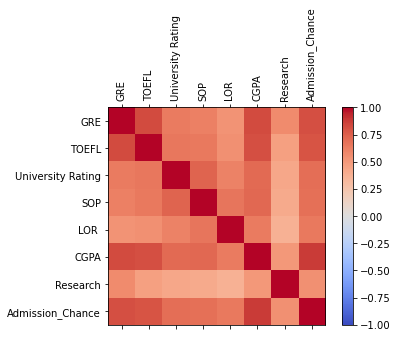

In [441]:
import matplotlib.pyplot as plt
corr = df.corr()
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(df.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(df.columns)
ax.set_yticklabels(df.columns)
plt.show()

As you can see in the below correlation chart all values have a positive correlation > 0. 

<AxesSubplot:>

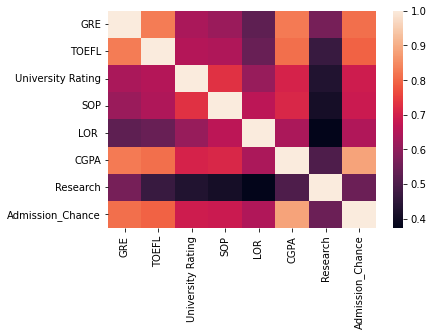

In [442]:
import seaborn as sns
corr = df.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

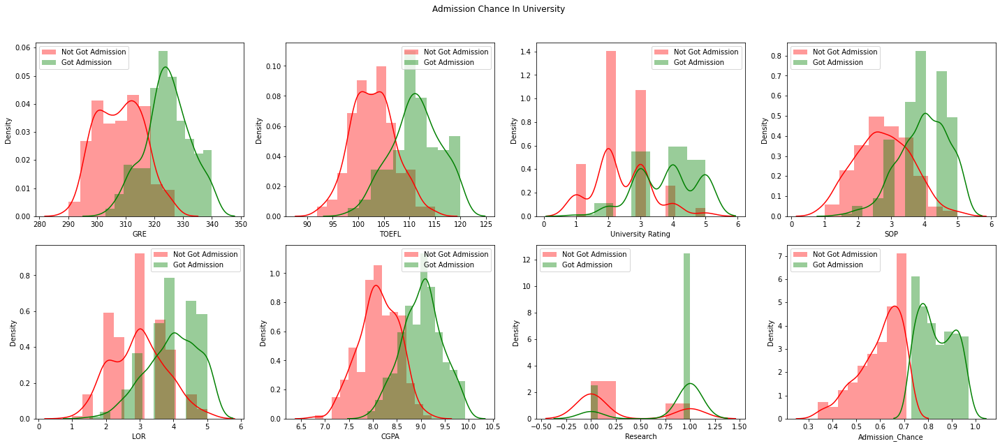

In [446]:
fig = plt.figure(figsize = (20, 25))
j = 0
for i in df.columns:
    plt.subplot(6, 4, j+1)
    j += 1
    sns.distplot(df[i][df['Admission_Chance']<0.72], color='r', label = 'Not Got Admission')
    sns.distplot(df[i][df['Admission_Chance']>0.72], color='g', label = 'Got Admission')
    plt.legend(loc='best')
fig.suptitle('Admission Chance In University ')
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

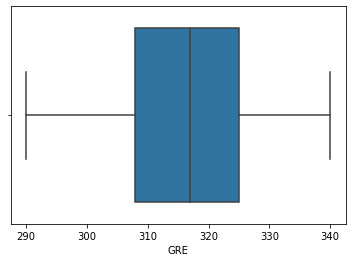

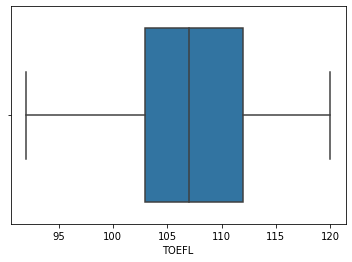

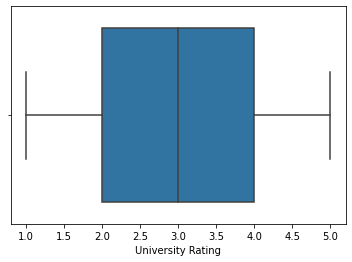

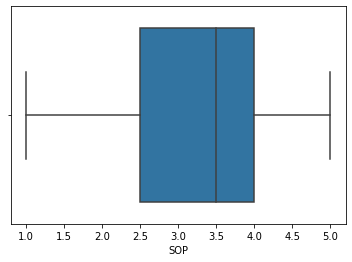

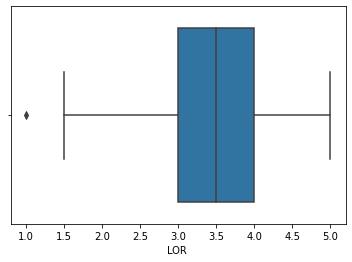

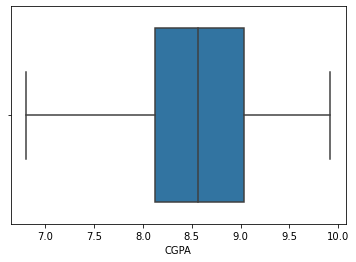

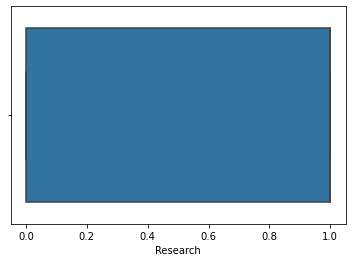

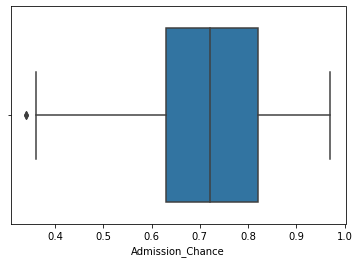

In [447]:
for column in df:
    plt.figure()
    sns.boxplot(x=df[column])

that's good we have almost no outliers. only one in LOR and another one inAdmission_Chance. 

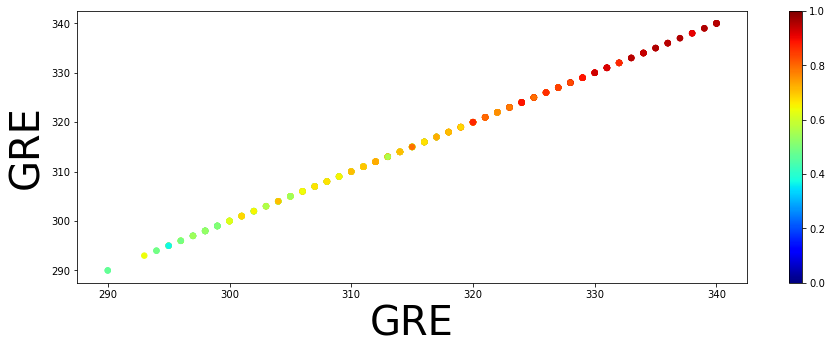

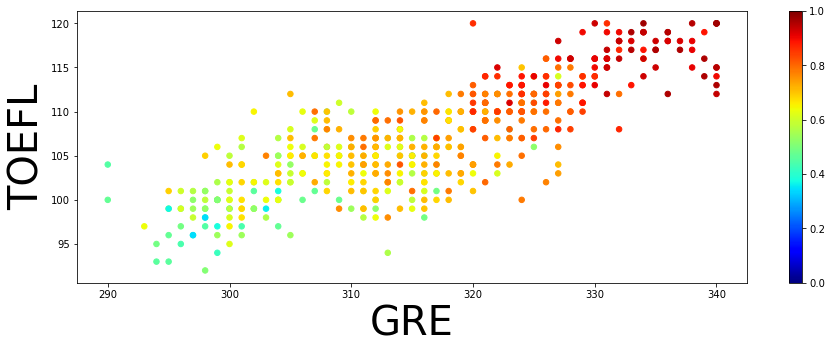

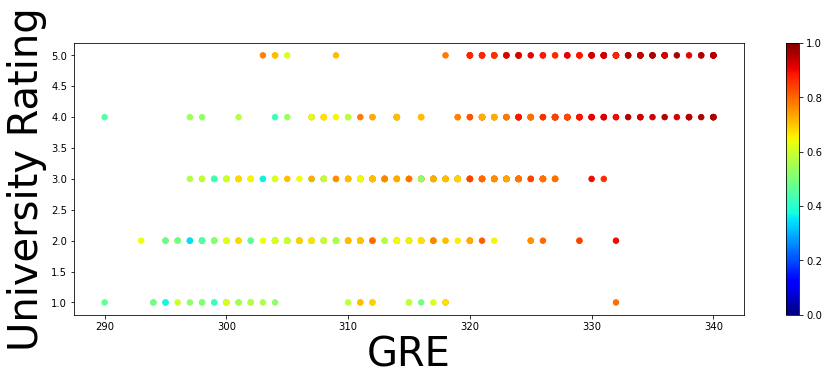

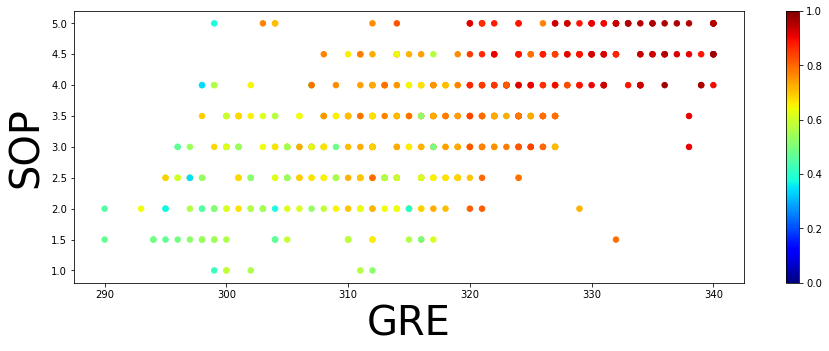

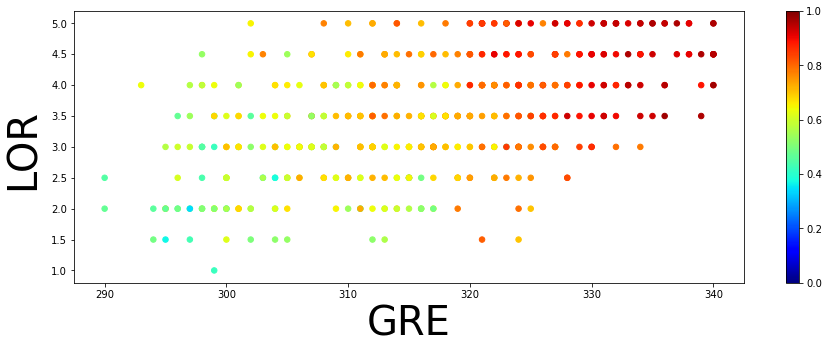

...

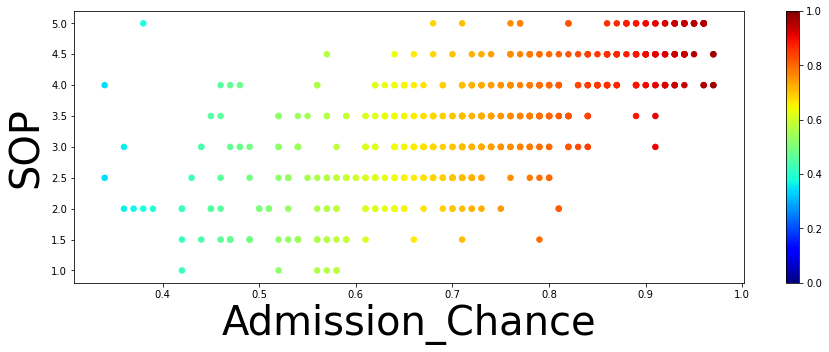

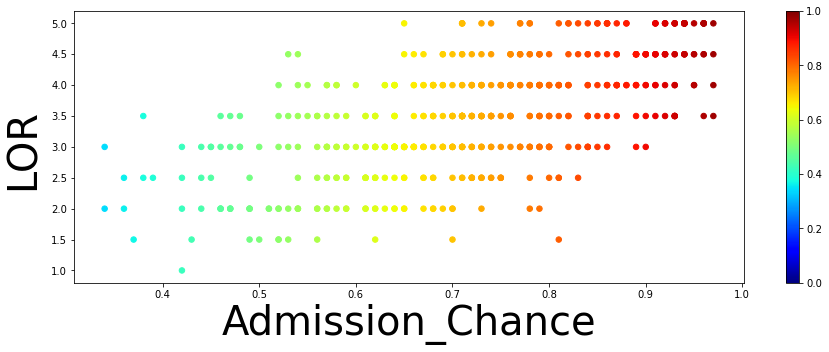

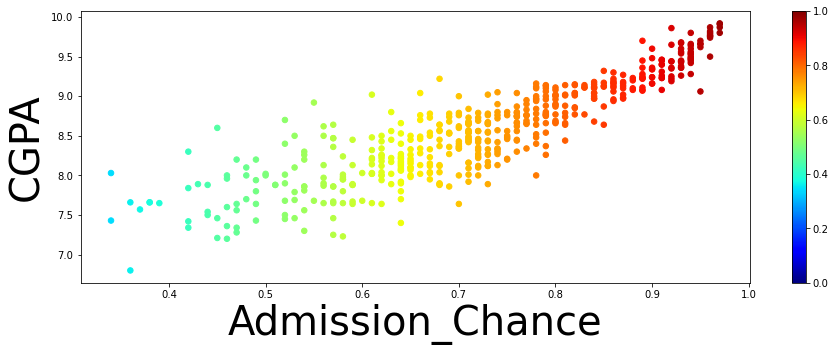

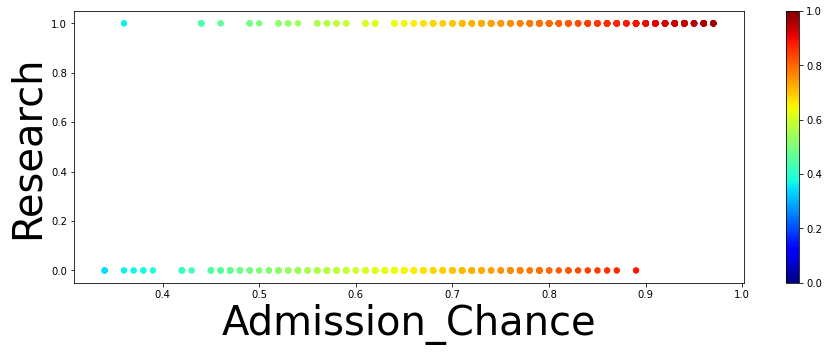

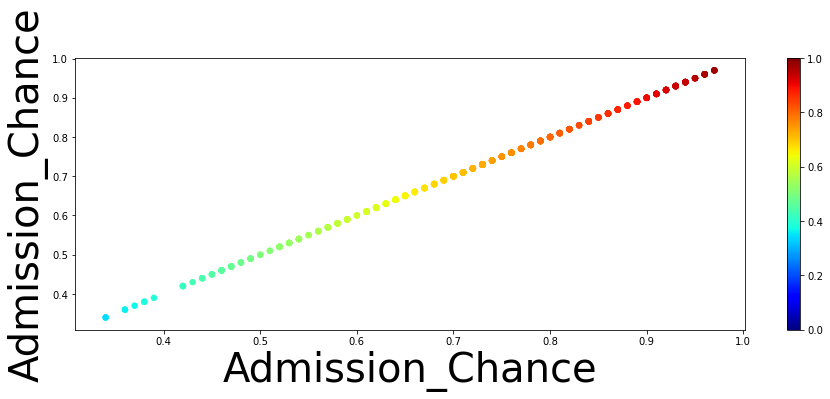

In [448]:
#admission chance goes from 0% to 100% 
for column_1st in df:
    for coloum_2nd in df:
        jet=plt.get_cmap('jet')
        plt.figure(figsize=(15,5))
        plt.scatter(df[column_1st], df[coloum_2nd], s=30, c=df['Admission_Chance'], vmin=0, vmax=1, cmap=jet)
        plt.xlabel(column_1st,fontsize=40)
        plt.ylabel(coloum_2nd,fontsize=40)
        plt.colorbar()
        plt.show()

If you see in all charts the red colors that are between 85% and 100% chance of being admited are in the top right corner,
which is the maximum value for both variables. 

In [449]:
X=np.asarray(df.drop("Admission_Chance",axis=1))
Y=np.asarray(df["Admission_Chance"])

In [450]:
X

array([[337.  , 118.  ,   4.  , ...,   4.5 ,   9.65,   1.  ],
       [324.  , 107.  ,   4.  , ...,   4.5 ,   8.87,   1.  ],
       [316.  , 104.  ,   3.  , ...,   3.5 ,   8.  ,   1.  ],
       ...,
       [330.  , 120.  ,   5.  , ...,   5.  ,   9.56,   1.  ],
       [312.  , 103.  ,   4.  , ...,   5.  ,   8.43,   0.  ],
       [327.  , 113.  ,   4.  , ...,   4.5 ,   9.04,   0.  ]])

In [451]:
X.shape

(500, 7)

In [455]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.2, random_state=0)

In [456]:
from sklearn.preprocessing import MinMaxScaler
scaler =  MinMaxScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.fit_transform(X_test)

# Create the Neural Network

In [452]:
Y.shape

(500,)

In [560]:
# define base model
def baseline_model():
    # create model
    model = Sequential()
    
    
    
    model.add(Dense(16, input_dim=7, activation='relu'))
    
    
    model.add(Dense(10, activation='relu'))
    
    
    model.add(Dense(1))
    # Compile model
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

In [571]:
estimator = KerasRegressor(build_fn=baseline_model, epochs=40, batch_size=3, verbose=1)

In [572]:
history=estimator.fit(X_train,y_train)

Epoch 1/40
134/134 [==============================] - 0s 1ms/step - loss: 0.0256
Epoch 2/40
134/134 [==============================] - 0s 845us/step - loss: 0.0128
Epoch 3/40
134/134 [==============================] - 0s 950us/step - loss: 0.0090
Epoch 4/40
134/134 [==============================] - 0s 862us/step - loss: 0.0076
Epoch 5/40
134/134 [==============================] - 0s 1ms/step - loss: 0.0063
Epoch 6/40
134/134 [==============================] - 0s 930us/step - loss: 0.0057
Epoch 7/40
134/134 [==============================] - 0s 909us/step - loss: 0.0050
Epoch 8/40
134/134 [==============================] - 0s 1ms/step - loss: 0.0049
Epoch 9/40
134/134 [==============================] - 0s 981us/step - loss: 0.0045
Epoch 10/40
134/134 [==============================] - 0s 1ms/step - loss: 0.0044
Epoch 11/40
134/134 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 12/40
134/134 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 13/40
1

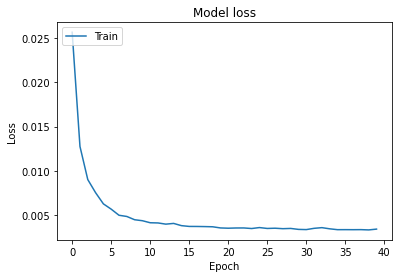

In [573]:
# Plot training & validation loss values
plt.plot(history.history['loss'])

plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [463]:
from sklearn.metrics import accuracy_score

In [574]:
prediction = estimator.predict(X_test)

34/34 [==============================] - 0s 728us/step


In [496]:
prediction.shape

(100,)

In [497]:
y_test.shape

(100,)

In [575]:
train_error =  np.abs(y_test - prediction)

In [576]:
train_error 

array([0.01706378, 0.01312402, 0.01740234, 0.00093946, 0.18399786,
       0.07343628, 0.06286595, 0.02117047, 0.02814044, 0.0360494 ,
       0.07607301, 0.04319095, 0.02931495, 0.04137007, 0.03379034,
       0.00339227, 0.02193994, 0.079096  , 0.0302829 , 0.06446393,
       0.09820867, 0.02237164, 0.11813197, 0.02809007, 0.0314926 ,
       0.04807468, 0.03747506, 0.14856578, 0.05696501, 0.07910617,
       0.03462904, 0.02568743, 0.01338511, 0.00955104, 0.16430239,
       0.00781765, 0.01878015, 0.00571324, 0.08368499, 0.08353372,
       0.05632368, 0.06975128, 0.01192311, 0.03168797, 0.04657568,
       0.05533921, 0.06013171, 0.05585414, 0.02342072, 0.00406778,
       0.07483047, 0.05833202, 0.00915691, 0.00289727, 0.05591544,
       0.09354743, 0.20803839, 0.01339413, 0.10423921, 0.03042768,
       0.07111371, 0.04989336, 0.0576798 , 0.04280295, 0.07715198,
       0.13815562, 0.21598993, 0.00699456, 0.07045571, 0.05588516,
       0.01346995, 0.22098233, 0.06954408, 0.12474857, 0.04590

In [577]:
mean_error = np.mean(train_error)
min_error = np.min(train_error)
max_error = np.max(train_error)
std_error = np.std(train_error)

In [578]:
print("std_error: ",std_error)
print("mean_error: ",mean_error)
print("min_error: ",min_error)
print("max_error: ",max_error)

std_error:  0.04774369562283303
mean_error:  0.05790209338665009
min_error:  0.0009394550323486017
max_error:  0.22098232507705684


The predicted values were very close to the actuals since the to lines overlap in many intervals. 

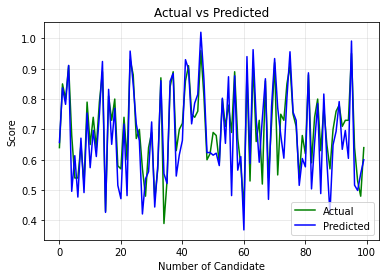

In [579]:
#Visualising the Acutal and predicted Result
plt.plot(y_test, color = 'green', label = 'Actual')
plt.plot(prediction, color = 'blue', label = 'Predicted')
plt.grid(alpha = 0.3)
plt.xlabel('Number of Candidate')
plt.ylabel('Score')
plt.title('Actual vs Predicted')
plt.legend()
plt.show()

In [514]:
from sklearn.metrics import r2_score

In [580]:
print("r_square score: ", r2_score(y_test,prediction))

r_square score:  0.6775154015784897


In [475]:
y_test

array([0.64, 0.85, 0.8 , 0.91, 0.68, 0.54, 0.54, 0.65, 0.52, 0.79, 0.65,
       0.74, 0.64, 0.79, 0.89, 0.43, 0.81, 0.73, 0.8 , 0.58, 0.57, 0.74,
       0.6 , 0.93, 0.88, 0.67, 0.7 , 0.57, 0.48, 0.64, 0.69, 0.47, 0.57,
       0.87, 0.39, 0.53, 0.84, 0.89, 0.63, 0.7 , 0.72, 0.86, 0.91, 0.75,
       0.74, 0.76, 0.96, 0.81, 0.6 , 0.62, 0.69, 0.68, 0.59, 0.8 , 0.71,
       0.78, 0.69, 0.89, 0.67, 0.58, 0.44, 0.89, 0.53, 0.92, 0.66, 0.73,
       0.52, 0.86, 0.54, 0.72, 0.92, 0.55, 0.75, 0.73, 0.85, 0.91, 0.75,
       0.71, 0.54, 0.68, 0.62, 0.88, 0.59, 0.74, 0.8 , 0.63, 0.77, 0.65,
       0.57, 0.7 , 0.76, 0.78, 0.71, 0.73, 0.73, 0.95, 0.64, 0.53, 0.48,
       0.64])

In [581]:
#compare some actuals with the predicted values. 
print("real value of y_test[1]: " + str(y_test[1]) + " -> the predict: " + str(estimator.predict(X_test[[1],:])))
print("real value of y_test[2]: " + str(y_test[2]) + " -> the predict: " + str(estimator.predict(X_test[[2],:])))
print("real value of y_test[2]: " + str(y_test[3]) + " -> the predict: " + str(estimator.predict(X_test[[3],:])))
print("real value of y_test[2]: " + str(y_test[4]) + " -> the predict: " + str(estimator.predict(X_test[[4],:])))
print("real value of y_test[2]: " + str(y_test[5]) + " -> the predict: " + str(estimator.predict(X_test[[5],:])))
print("real value of y_test[2]: " + str(y_test[6]) + " -> the predict: " + str(estimator.predict(X_test[[6],:])))

1/1 [==============================] - 0s 22ms/step
real value of y_test[1]: 0.85 -> the predict: 0.836876
1/1 [==============================] - 0s 19ms/step
real value of y_test[2]: 0.8 -> the predict: 0.78259766
1/1 [==============================] - 0s 23ms/step
real value of y_test[2]: 0.91 -> the predict: 0.9109394
1/1 [==============================] - 0s 32ms/step
real value of y_test[2]: 0.68 -> the predict: 0.49600214
1/1 [==============================] - 0s 19ms/step
real value of y_test[2]: 0.54 -> the predict: 0.6134362
1/1 [==============================] - 0s 18ms/step
real value of y_test[2]: 0.54 -> the predict: 0.47713405


In [582]:
train_prediction = estimator.predict(X_train)

134/134 [==============================] - 0s 970us/step


In [583]:
print("r_square score (train dataset): ", r2_score(y_train,train_prediction))

r_square score (train dataset):  0.8177940431703327


# This model is overfitted compare the train r2_scores with the test r2_scores. The data set has very few rows, therefore the neural network is too complex for this few data. Note that we use two hidden layers, the first one with 16 neurons and the second one with 10 neurons. 

In [585]:
# Save the weights
estimator.model.save_weights('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/regression_model.h5')

In [586]:
# Save the model architecture
with open('model_architecture.json', 'w') as f:
    f.write(estimator.model.to_json())

# Example of a Neural Network Configuration for regression: 

In [588]:
model = Sequential()
model.add(Dense(6, input_dim=6, kernel_initializer='normal', activation='relu'))
model.add(Dense(2670, activation='relu'))
model.add(Dense(1, activation='linear'))
model.summary()

Model: "sequential_436"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1063 (Dense)          (None, 6)                 42        
                                                                 
 dense_1064 (Dense)          (None, 2670)              18690     
                                                                 
 dense_1065 (Dense)          (None, 1)                 2671      
                                                                 
Total params: 21,403
Trainable params: 21,403
Non-trainable params: 0
_________________________________________________________________


In [120]:
model.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])
#history=model.fit(xtrain_scale, ytrain_scale, epochs=30, batch_size=150, verbose=1, validation_split=0.2)
#predictions = model.predict(xval_scale)
#r2_score(y_test,predictions))

In [591]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
dataset = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/housingdata.csv')
dataset.head(2)

,CRIM,Zone,INDUS,CHAL,NOX con,Rooms,Age,Dis,RAD,TAX,Pupil Radio,Black,LSTA,Median val
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.9,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.9,9.14,21.6


In [592]:
dataset.describe(include='all')

,CRIM,Zone,INDUS,CHAL,NOX con,Rooms,Age,Dis,RAD,TAX,Pupil Radio,Black,LSTA,Median val
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


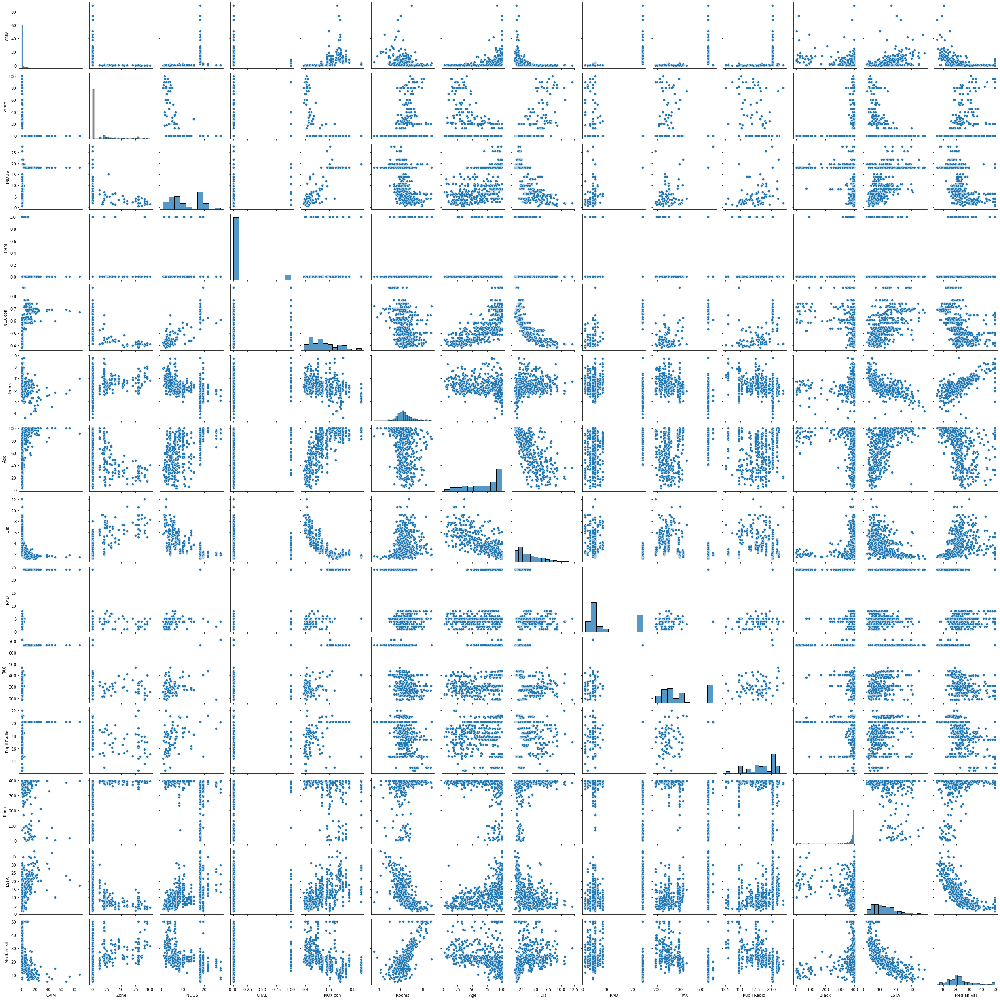

In [593]:
sns.pairplot(dataset)

In [598]:
X=dataset.iloc[:,0:13]
y=dataset.iloc[:,13].values

# All input features are numerical so we need to scale them. StandardScaler works well when the data is normally distributed. Based on the pair plot we see that the data is not normally distributed. Hence we use MinMaxScaler to scale the data

In [599]:
from sklearn.preprocessing import  MinMaxScaler
sc= MinMaxScaler()
X= sc.fit_transform(X)
y= y.reshape(-1,1)
y=sc.fit_transform(y)

In [601]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

Creating the neural network for the regressor. We have 13 input nodes, we create one hidden layer with 13 nodes and an output layer.

As this a regression problem, the loss function we use is mean squared error and the metrics against which we evaluate the performance of the model is mean absolute error and accuracy.

Mean absolute error is the absolute difference between the predicted value and the actual value.

we define a function build_regressor to use these wrappers. build_regressor creates and returns the Keras sequential model.

In [602]:
X_train.shape

(354, 13)

In [604]:
from keras import Sequential
from keras.layers import Dense
def build_regressor():
    regressor = Sequential()
    regressor.add(Dense(units=10, input_dim=13))
    regressor.add(Dense(1,activation = 'linear'))
    regressor.compile(optimizer='adam', loss='mean_squared_error',  metrics=['mae','accuracy'])
    return regressor

In [666]:
# define base model
def build_regressor():
    # create model
    model = Sequential()
    
    
    
    model.add(Dense(13, input_dim=13, activation='relu'))
    
    
    #model.add(Dense(10, activation='relu'))
    
    
    model.add(Dense(1,activation = 'linear'))
    # Compile model
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae','accuracy'])
    return model

In [667]:
from keras.wrappers.scikit_learn import KerasRegressor
regressor = KerasRegressor(build_fn=build_regressor, batch_size=32,epochs=100)

In [668]:
results=regressor.fit(X_train,y_train)

Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 0.1832 - mae: 0.3728 - accuracy: 0.0056
Epoch 2/100
12/12 [==============================] - 0s 2ms/step - loss: 0.1040 - mae: 0.2653 - accuracy: 0.0056
Epoch 3/100
12/12 [==============================] - 0s 2ms/step - loss: 0.0671 - mae: 0.2050 - accuracy: 0.0056
Epoch 4/100
12/12 [==============================] - 0s 2ms/step - loss: 0.0542 - mae: 0.1714 - accuracy: 0.0028
Epoch 5/100
12/12 [==============================] - 0s 2ms/step - loss: 0.0490 - mae: 0.1592 - accuracy: 0.0056
Epoch 6/100
12/12 [==============================] - 0s 2ms/step - loss: 0.0446 - mae: 0.1516 - accuracy: 0.0085
Epoch 7/100
12/12 [==============================] - 0s 2ms/step - loss: 0.0412 - mae: 0.1444 - accuracy: 0.0141
Epoch 8/100
12/12 [==============================] - 0s 2ms/step - loss: 0.0382 - mae: 0.1377 - accuracy: 0.0141
Epoch 9/100
12/12 [==============================] - 0s 2ms/step - loss: 0.0358 - mae: 0.1314 - 

In [669]:
y_pred= regressor.predict(X_test)

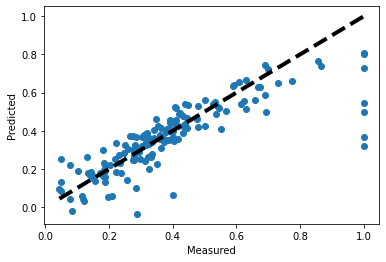

In [670]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

# Couple of tips for better accuracy: Always standardize both input features and target variable. If we only standardize input feature then we will get incorrect predictions.Data may not be always normally distributed so check the data and then based on the distribution apply StandardScaler, MinMaxScaler, Normalizer or RobustScaler

# Tf-Keras Regression for Performance Prediction

In [121]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [122]:
stud_perf=pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/StudentsPerformance.csv')
stud_perf.head()

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


In [123]:
stud_perf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   gender                       1000 non-null   object
 1   race/ethnicity               1000 non-null   object
 2   parental level of education  1000 non-null   object
 3   lunch                        1000 non-null   object
 4   test preparation course      1000 non-null   object
 5   math score                   1000 non-null   int64 
 6   reading score                1000 non-null   int64 
 7   writing score                1000 non-null   int64 
dtypes: int64(3), object(5)
memory usage: 62.6+ KB


In [124]:
stud_perf.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
math score,1000.0,66.089,15.163080,0.0,57.00,66.0,77.0,100.0
reading score,1000.0,69.169,14.600192,17.0,59.00,70.0,79.0,100.0
writing score,1000.0,68.054,15.195657,10.0,57.75,69.0,79.0,100.0


# Let's crete new column representing total marks which is nothing but sum of math, reading and writing scores

In [125]:
stud_perf['Total marks']=stud_perf['math score']+stud_perf['reading score']+stud_perf['writing score']

In [126]:
stud_perf.head()

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score,Total marks
0,female,group B,bachelor's degree,standard,none,72,72,74,218
1,female,group C,some college,standard,completed,69,90,88,247
2,female,group B,master's degree,standard,none,90,95,93,278
3,male,group A,associate's degree,free/reduced,none,47,57,44,148
4,male,group C,some college,standard,none,76,78,75,229


# Exploratory Data Analysis

In [127]:
!pip install cufflinks

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import cufflinks as cf
cf.go_offline()

In [129]:
stud_perf['gender'].iplot(kind = 'histogram',title='Gender Count')

In [131]:
stud_perf.columns

Index(['gender', 'race/ethnicity', 'parental level of education', 'lunch',
       'test preparation course', 'math score', 'reading score',
       'writing score', 'Total marks'],
      dtype='object')

In [132]:
px.pie(stud_perf, names='race/ethnicity', title='race/ethnicity')

In [133]:
fig = px.histogram(stud_perf, 
                   x="Total marks", 
                   color="gender",
                   marginal="box",
                   title='Genderwise distribution of Total marks',
                   color_discrete_sequence=['lightblue','teal'],
                   nbins=50, 
                   hover_data=stud_perf.columns)
fig.show()

In [134]:
stud_perf['test preparation course'].nunique()

2

In [135]:
fig = px.histogram(stud_perf, 
                   x="test preparation course", 
                   color="gender",
                   title='Test preparation course Taken or not',
                   color_discrete_sequence=['lightblue','teal'], 
                   hover_data=stud_perf.columns)
fig.show()

In [136]:
stud_perf['lunch'].nunique()

2

In [137]:
stud_perf['lunch'].value_counts()

standard        645
free/reduced    355
Name: lunch, dtype: int64

In [138]:
fig = px.histogram(stud_perf, 
                   x="Total marks", 
                   color="lunch",
                   title='Lunch type wise distribution of Total marks',
                   marginal="box",
                   color_discrete_sequence=['blue','green'], 
                   hover_data=stud_perf.columns)
fig.show()

# Nueral Network Model for Predictive Analysis

Converting Categorical Features Into Numerical
To predict the total marks of any student in the table we need to take into consideration all the columns.
So lets convert the categorical data columns into numerical ones by using get_dummies function

In [139]:
#the first five columns are categorical. 
stud_perf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   gender                       1000 non-null   object
 1   race/ethnicity               1000 non-null   object
 2   parental level of education  1000 non-null   object
 3   lunch                        1000 non-null   object
 4   test preparation course      1000 non-null   object
 5   math score                   1000 non-null   int64 
 6   reading score                1000 non-null   int64 
 7   writing score                1000 non-null   int64 
 8   Total marks                  1000 non-null   int64 
dtypes: int64(4), object(5)
memory usage: 70.4+ KB


In [140]:
stud_perf.columns[:5]

Index(['gender', 'race/ethnicity', 'parental level of education', 'lunch',
       'test preparation course'],
      dtype='object')

In [141]:
stud_perf1=pd.get_dummies(stud_perf[stud_perf.columns[:5]], drop_first=False)
stud_perf1.head()

,gender_female,gender_male,race/ethnicity_group A,race/ethnicity_group B,race/ethnicity_group C,race/ethnicity_group D,race/ethnicity_group E,parental level of education_associate's degree,parental level of education_bachelor's degree,parental level of education_high school,parental level of education_master's degree,parental level of education_some college,parental level of education_some high school,lunch_free/reduced,lunch_standard,test preparation course_completed,test preparation course_none
0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1
1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0
2,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1
3,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1
4,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1


In [142]:
stud_perf.drop(['gender', 'race/ethnicity', 'parental level of education', 'lunch','test preparation course'], axis=1, inplace=True)
stud_perf=pd.concat([stud_perf1, stud_perf], axis=1)
stud_perf.head()

,gender_female,gender_male,race/ethnicity_group A,race/ethnicity_group B,race/ethnicity_group C,race/ethnicity_group D,race/ethnicity_group E,parental level of education_associate's degree,parental level of education_bachelor's degree,parental level of education_high school,parental level of education_master's degree,parental level of education_some college,parental level of education_some high school,lunch_free/reduced,lunch_standard,test preparation course_completed,test preparation course_none,math score,reading score,writing score,Total marks
0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,72,72,74,218
1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,69,90,88,247
2,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,90,95,93,278
3,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,47,57,44,148
4,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,76,78,75,229


In [143]:
stud_perf.describe().T

,count,mean,std,min,25%,50%,75%,max
gender_female,1000.0,0.518,0.499926,0.0,0.00,1.0,1.0,1.0
gender_male,1000.0,0.482,0.499926,0.0,0.00,0.0,1.0,1.0
race/ethnicity_group A,1000.0,0.089,0.284886,0.0,0.00,0.0,0.0,1.0
race/ethnicity_group B,1000.0,0.190,0.392497,0.0,0.00,0.0,0.0,1.0
race/ethnicity_group C,1000.0,0.319,0.466322,0.0,0.00,0.0,1.0,1.0
race/ethnicity_group D,1000.0,0.262,0.439943,0.0,0.00,0.0,1.0,1.0
race/ethnicity_group E,1000.0,0.140,0.347161,0.0,0.00,0.0,0.0,1.0
parental level of education_associate's degree,1000.0,0.222,0.415799,0.0,0.00,0.0,0.0,1.0
parental level of education_bachelor's degree,1000.0,0.118,0.322770,0.0,0.00,0.0,0.0,1.0
parental level of education_high school,1000.0,0.196,0.397167,0.0,0.00,0.0,0.0,1.0


In [144]:
from sklearn.model_selection import train_test_split #for spliting the data
from sklearn import metrics #for evaluation of the model

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam

# Train Test Split

In [145]:
X=stud_perf.drop(['Total marks'], axis=1)
y=stud_perf['Total marks']
#train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [146]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [147]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [148]:
print(X_train.shape)
print(X_test.shape)

(700, 20)
(300, 20)


In [149]:
y_train.shape

(700,)

In [153]:
y_train.values

array([214, 212, 164, 113, 247, 252, 172, 204, 195, 207, 161, 188, 224,
       208, 178, 271, 223, 239, 154, 152, 179, 278, 291, 115, 225, 184,
       211, 157, 173, 185, 287, 241, 220, 193, 214, 199, 223, 224, 233,
       239, 244, 180, 213, 205, 223, 275, 204, 160, 214, 278, 188, 140,
       168, 134, 232, 170, 249, 261, 206, 240, 176, 196, 166, 232, 225,
       219, 192, 187, 176, 103, 187, 145, 207, 259, 172, 150, 198, 210,
       170, 242, 186, 159, 225, 134, 297, 229, 205, 260, 266, 160, 252,
       225, 184, 183, 267, 223, 255, 254, 207, 233, 247, 222, 155, 164,
       213, 225, 167, 243, 140, 198, 177, 247, 175, 173, 184, 223, 146,
       234, 191, 200, 292, 257, 265, 178, 167, 166, 222, 265, 209, 220,
        89, 261, 210, 224, 198, 257, 195, 201, 228, 189, 176, 210, 247,
       169, 178, 153, 225, 155, 131, 164, 219, 150, 158, 241, 239, 206,
       162, 234, 236, 160, 253, 158, 117, 161, 114, 208, 223, 259, 217,
       161, 224, 260, 184,  95, 200, 213, 227, 199, 220, 264, 20

# Creating a Model

In [158]:
model = Sequential() # For regression 


model.add(Dense(15,input_dim=20, activation='relu'))
model.add(Dense(15,activation='relu'))
model.add(Dense(15,activation='relu'))
model.add(Dense(15,activation='relu'))
model.add(Dense(1,activation = 'linear'))

model.compile(optimizer='adam',loss='mse',metrics=['mse']) # Adam optimization and Mean squared error as loss function  

In [159]:
model.fit(x=X_train,y=y_train.values,validation_data=(X_test,y_test.values),epochs=100)

Epoch 1/100
22/22 [==============================] - 1s 9ms/step - loss: 42989.6445 - mse: 42989.6445 - val_loss: 42764.6680 - val_mse: 42764.6680
Epoch 2/100
22/22 [==============================] - 0s 3ms/step - loss: 42554.9922 - mse: 42554.9922 - val_loss: 42043.0234 - val_mse: 42043.0234
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 41306.3984 - mse: 41306.3984 - val_loss: 39972.6602 - val_mse: 39972.6602
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 37891.6328 - mse: 37891.6328 - val_loss: 34596.5977 - val_mse: 34596.5977
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 29892.1973 - mse: 29892.1973 - val_loss: 23201.5508 - val_mse: 23201.5508
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 15776.1211 - mse: 15776.1211 - val_loss: 7337.5518 - val_mse: 7337.5518
Epoch 7/100
22/22 [==============================] - 0s 3ms/step - loss: 3313.8557 - mse: 3313.8557 - val_loss: 1533.405

Epoch 61/100
22/22 [==============================] - 0s 3ms/step - loss: 0.7677 - mse: 0.7677 - val_loss: 0.7816 - val_mse: 0.7816
Epoch 62/100
22/22 [==============================] - 0s 3ms/step - loss: 0.7108 - mse: 0.7108 - val_loss: 0.7509 - val_mse: 0.7509
Epoch 63/100
22/22 [==============================] - 0s 3ms/step - loss: 0.7126 - mse: 0.7126 - val_loss: 0.7567 - val_mse: 0.7567
Epoch 64/100
22/22 [==============================] - 0s 4ms/step - loss: 0.6923 - mse: 0.6923 - val_loss: 0.7117 - val_mse: 0.7117
Epoch 65/100
22/22 [==============================] - 0s 5ms/step - loss: 0.6583 - mse: 0.6583 - val_loss: 0.7149 - val_mse: 0.7149
Epoch 66/100
22/22 [==============================] - 0s 6ms/step - loss: 0.6596 - mse: 0.6596 - val_loss: 0.6645 - val_mse: 0.6645
Epoch 67/100
22/22 [==============================] - 0s 6ms/step - loss: 0.6322 - mse: 0.6322 - val_loss: 0.6667 - val_mse: 0.6667
Epoch 68/100
22/22 [==============================] - 0s 4ms/step - loss: 0.

Text(0.5, 0, 'MSE')

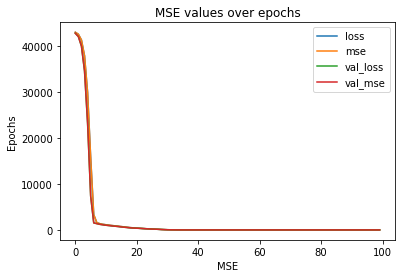

In [160]:
# Model performance (based on mse value) over epochs
losses = pd.DataFrame(model.history.history)
losses.plot()
plt.title('MSE values over epochs')
plt.ylabel('Epochs')
plt.xlabel('MSE')

In [161]:
predictions = model.predict(X_test)

In [162]:
print("The Mean Absolute Error : ",metrics.mean_absolute_error(y_test,predictions))

The Mean Absolute Error :  0.3801886749267578


In [163]:
print("The Root Mean Squared Error : ",np.sqrt(metrics.mean_squared_error(y_test,predictions)))

The Root Mean Squared Error :  0.5295448757083043


In [164]:
from sklearn.metrics import r2_score

# ALMOST PERFECT r2_score! 

In [165]:
print("r_square score: ", r2_score(y_test,predictions))

r_square score:  0.9998311127548289


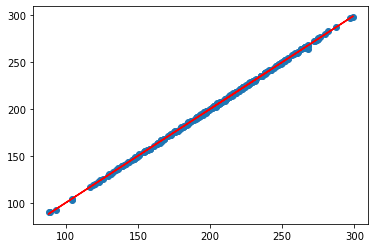

In [166]:
# Our predictions
plt.scatter(y_test,predictions)

# Perfect predictions
plt.plot(y_test,y_test,'r')

# By looking at the above graph itself we can say that our model is very well fitted

# Deep Feed Forward Neural Networks and the Advantage of ReLU Activation Function

In [167]:
# Tensorflow / Keras
import tensorflow as tf # used to access argmax function
from tensorflow import keras # for building Neural Networks
print('Tensorflow/Keras: %s' % keras.__version__) # print version
from keras.models import Sequential # for creating a linear stack of layers for our Neural Network
from keras import Input # for instantiating a keras tensor
from keras.layers import Dense # for creating regular densely-connected NN layer.

# Data manipulation
import pandas as pd # for data manipulation
print('pandas: %s' % pd.__version__) # print version
import numpy as np # for data manipulation
print('numpy: %s' % np.__version__) # print version

# Sklearn
import sklearn # for model evaluation
print('sklearn: %s' % sklearn.__version__) # print version
from sklearn.metrics import classification_report # for model evaluation metrics

# Visualization
import matplotlib 
import matplotlib.pyplot as plt # for showing handwritten digits
print('matplotlib: %s' % matplotlib.__version__) # print version

Tensorflow/Keras: 2.7.0
pandas: 1.3.4
numpy: 1.22.4
sklearn: 1.2.2
matplotlib: 3.4.3


Next, we ingest MNIST handwritten digits data and display the first ten digits with their true labels above the images.

In [168]:
#Load digits data 
(X_train, y_train), (X_test, y_test) = keras.datasets.mnist.load_data()

In [169]:
X_train.shape

(60000, 28, 28)

In [170]:
y_train

array([5, 0, 4, ..., 5, 6, 8], dtype=uint8)

In [171]:
y_train.shape

(60000,)

In [172]:
# Print shapes
print("Shape of X_train: ", X_train.shape)
print("Shape of y_train: ", y_train.shape)
print("Shape of X_test: ", X_test.shape)
print("Shape of y_test: ", y_test.shape)

Shape of X_train:  (60000, 28, 28)
Shape of y_train:  (60000,)
Shape of X_test:  (10000, 28, 28)
Shape of y_test:  (10000,)


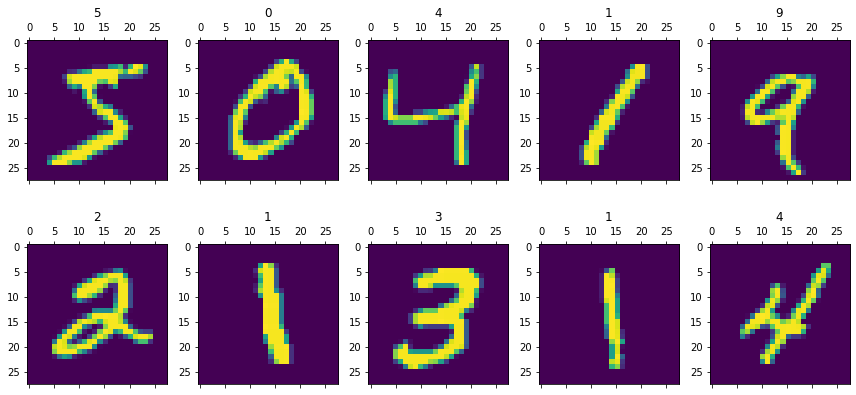

In [173]:
# Display images of the first 10 digits in the training set and their true lables
fig, axs = plt.subplots(2, 5, sharey=False, tight_layout=True, figsize=(12,6), facecolor='white')
n=0
for i in range(0,2):
    for j in range(0,5):
        axs[i,j].matshow(X_train[n])
        axs[i,j].set(title=y_train[n])
        n=n+1
plt.show() 

For most images, pixel values are integers that range from 0 (black) to 255 (white)

As you can see, we have 60,000 images in the training set and 10,000 in the test set. Note that their dimensions are 28 x 28 pixels. However, we need to reshape the data before using it to train the DFF Neural Network.

In [174]:
28*28

784

In [175]:
# Reshape and normalize (divide by 255) input data
X_train = X_train.reshape(60000, 784).astype("float32") / 255
X_test = X_test.reshape(10000, 784).astype("float32") / 255

# Print shapes
print("New shape of X_train: ", X_train.shape)
print("New shape of X_test: ", X_test.shape)

New shape of X_train:  (60000, 784)
New shape of X_test:  (10000, 784)


# Training and Evaluating a Deep Feed Forward Neural Network

I have provided extensive commentary within the code, so I will not repeat the same in the body of the article. However, there are a few things that I would like to highlight:

One Hot Encoding can be defined as a process of transforming categorical variables into numerical format before fitting and training a Machine Learning algorithm.

Softmax activation in the output layer — this function takes values from all ten nodes and converts them to values between 0 and 1, where the sum of those ten values equals 1. Hence, you can imagine the output as a sort of “probability.” Since each output node represents a different digit between 0–9, the one with the highest value (“probability”) is what the Neural Net believes to be the correct answer.

Use of a “SparseCategoricalCrossentropy” for loss function — when your target data is binary, you should use “BinaryCrossentropy.” When you have two or more label classes, and your data is OneHot encoded, you should use “CategoricalCrossentropy.” In our scenario, we had ten classes to predict, but our target data was not OneHot encoded. Hence, we needed to use “SparseCategoricalCrossentropy.”

Predicting labels — since the prediction gives us ten values (one for each output node), we need to pass the result through the argmax function that takes it as an input and returns the digit with the highest value (“probability”).

Kernel initialization is the process of setting the initial weights of a neural network. The choice of initialization can significantly impact the model's learning speed and overall performance.

HeNormal works by initializing the weights of the network with values drawn from a normal distribution with a mean of 0 and a standard deviation of sqrt(2/n), where n is the number of neurons in the previous layer. This initialization helps to ensure that the variance of the activations remains constant across all layers of the network.

Idea behind HeNormal is that the variance of the activations should be roughly the same across all layers of the network. If the variance is too small, the signal will gradually diminish as it passes through each layer, resulting in vanishing gradients. Conversely, if the variance is too large, the signal will grow as it passes through each layer, resulting in exploding gradients.

By initializing the weights with values drawn from a normal distribution with a mean of 0 and a standard deviation of sqrt(2/n), HeNormal ensures that the variance of the activations is roughly the same across all layers of the network, regardless of the number of neurons in each layer. This helps prevent vanishing or exploding gradients and can improve the stability and convergence of the network during training.

In [176]:
##### Step 1 - Specify the structure of a Neural Network
model = Sequential(name="DFF-Model") # Model
model.add(Input(shape=(784,), name='Input-Layer')) # Input Layer - need to speicfy the shape of inputs
model.add(Dense(128, activation='relu', name='Hidden-Layer-1', kernel_initializer='HeNormal')) # Hidden Layer, relu(x) = max(x, 0)
model.add(Dense(64, activation='relu', name='Hidden-Layer-2', kernel_initializer='HeNormal')) # Hidden Layer, relu(x) = max(x, 0)
model.add(Dense(32, activation='relu', name='Hidden-Layer-3', kernel_initializer='HeNormal')) # Hidden Layer, relu(x) = max(x, 0)
model.add(Dense(10, activation='softmax', name='Output-Layer')) # Output Layer, softmax(x) = exp(x) / tf.reduce_sum(exp(x))

In [177]:
##### Step 2 - Compile keras model
model.compile(optimizer='adam', # default='rmsprop', an algorithm to be used in backpropagation
              loss='SparseCategoricalCrossentropy', # Loss function to be optimized. A string (name of loss function), or a tf.keras.losses.Loss instance.
              metrics=['Accuracy'], # List of metrics to be evaluated by the model during training and testing. Each of this can be a string (name of a built-in function), function or a tf.keras.metrics.Metric instance. 
              loss_weights=None, # default=None, Optional list or dictionary specifying scalar coefficients (Python floats) to weight the loss contributions of different model outputs.
              weighted_metrics=None, # default=None, List of metrics to be evaluated and weighted by sample_weight or class_weight during training and testing.
              run_eagerly=None, # Defaults to False. If True, this Model's logic will not be wrapped in a tf.function. Recommended to leave this as None unless your Model cannot be run inside a tf.function.
              steps_per_execution=None # Defaults to 1. The number of batches to run during each tf.function call. Running multiple batches inside a single tf.function call can greatly improve performance on TPUs or small models with a large Python overhead.
             )

In [178]:
##### Step 3 - Fit keras model on the dataset
model.fit(X_train, # input data
          y_train, # target data
          batch_size=20, # Number of samples per gradient update. If unspecified, batch_size will default to 32.
          epochs=5, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
          verbose='auto', # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
          callbacks=None, # default=None, list of callbacks to apply during training. See tf.keras.callbacks
          validation_split=0.2, # default=0.0, Fraction of the training data to be used as validation data. The model will set apart this fraction of the training data, will not train on it, and will evaluate the loss and any model metrics on this data at the end of each epoch. 
          #validation_data=(X_test, y_test), # default=None, Data on which to evaluate the loss and any model metrics at the end of each epoch. 
          shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
          class_weight=None, # default=None, Optional dictionary mapping class indices (integers) to a weight (float) value, used for weighting the loss function (during training only). This can be useful to tell the model to "pay more attention" to samples from an under-represented class.
          sample_weight=None, # default=None, Optional Numpy array of weights for the training samples, used for weighting the loss function (during training only).
          initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
          steps_per_epoch=None, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
          validation_steps=None, # Only relevant if validation_data is provided and is a tf.data dataset. Total number of steps (batches of samples) to draw before stopping when performing validation at the end of every epoch.
          validation_batch_size=None, # Integer or None, default=None, Number of samples per validation batch. If unspecified, will default to batch_size.
          validation_freq=5, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
          max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
          workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
          use_multiprocessing=False, # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
         )

Epoch 1/5
2400/2400 [==============================] - 7s 3ms/step - loss: 0.2648 - Accuracy: 0.9212
Epoch 2/5
2400/2400 [==============================] - 7s 3ms/step - loss: 0.1104 - Accuracy: 0.9659
Epoch 3/5
2400/2400 [==============================] - 6s 3ms/step - loss: 0.0799 - Accuracy: 0.9750
Epoch 4/5
2400/2400 [==============================] - 6s 3ms/step - loss: 0.0628 - Accuracy: 0.9802
Epoch 5/5
2400/2400 [==============================] - 7s 3ms/step - loss: 0.0488 - Accuracy: 0.9849 - val_loss: 0.0980 - val_Accuracy: 0.9713


In [179]:

##### Step 4 - Use model to make predictions
# Note, we need to pass model outputs through argmax to convert from probability to label
# Also, we convert output from tensor to numpy array
# Predict class labels on training data
pred_labels_tr = np.array(tf.math.argmax(model.predict(X_train),axis=1))
# Predict class labels on a test data
pred_labels_te = np.array(tf.math.argmax(model.predict(X_test),axis=1))

In [180]:
##### Step 5 - Model Performance Summary
print("")
print('-------------------- Model Summary --------------------')
model.summary() # print model summary
print("")


-------------------- Model Summary --------------------
Model: "DFF-Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden-Layer-1 (Dense)      (None, 128)               100480    
                                                                 
 Hidden-Layer-2 (Dense)      (None, 64)                8256      
                                                                 
 Hidden-Layer-3 (Dense)      (None, 32)                2080      
                                                                 
 Output-Layer (Dense)        (None, 10)                330       
                                                                 
Total params: 111,146
Trainable params: 111,146
Non-trainable params: 0
_________________________________________________________________



Hidden-Layer-1 (Dense) = 784 * 128 = 100.352 + 128 = 100.480
Hidden-Layer-2 (Dense) = 128* 64 = 8192 weights + 64 biases = 8256
Hidden-Layer-3 (Dense) = 64 * 32 = 2048 weights + 32 biases = 2080
Output-Layer (Dense) = 32*10 = 320 weights + 10 biases = 330 

In [181]:
print("")
print('---------- Evaluation on Training Data ----------')
print(classification_report(y_train, pred_labels_tr))
print("")


---------- Evaluation on Training Data ----------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5923
           1       0.99      0.99      0.99      6742
           2       0.99      0.99      0.99      5958
           3       0.97      0.99      0.98      6131
           4       0.97      1.00      0.98      5842
           5       0.99      0.98      0.98      5421
           6       0.99      0.99      0.99      5918
           7       0.99      0.98      0.99      6265
           8       0.99      0.97      0.98      5851
           9       0.99      0.96      0.98      5949

    accuracy                           0.99     60000
   macro avg       0.99      0.99      0.99     60000
weighted avg       0.99      0.99      0.99     60000




In [182]:
print('---------- Evaluation on Test Data ----------')
print(classification_report(y_test, pred_labels_te))
print("")

---------- Evaluation on Test Data ----------
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       980
           1       0.98      0.99      0.99      1135
           2       0.98      0.96      0.97      1032
           3       0.93      0.99      0.96      1010
           4       0.95      0.99      0.97       982
           5       0.98      0.97      0.97       892
           6       0.98      0.98      0.98       958
           7       0.99      0.97      0.98      1028
           8       0.98      0.96      0.97       974
           9       0.98      0.95      0.97      1009

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000




# While 97% accuracy on test data is pretty decent, you could improve the results by training over more epochs or experimenting with the network structure.

In [183]:
#predict the first 10 values a compare to the real actual labels: 
pred_labels_tr = np.array(tf.math.argmax(model.predict(X_train[0:10]),axis=1))

In [184]:
#all values were correctly predicted. 
print(y_train[0:10])
print(pred_labels_tr)

[5 0 4 1 9 2 1 3 1 4]
[5 0 4 1 9 2 1 3 1 4]
